# Data Analysis of CA State for 2019

In [1]:
# Dependencies and Setup
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import rcParams
import scipy.stats as sts
import os
from collections import Counter
import requests
import json
import gmaps
import warnings
from scipy import stats
import matplotlib.image as mpimg

# Google API Key
from api_keys import gkey

# Configure gmaps
gmaps.configure(gkey)

In [2]:
#setting background of figure 
plt.style.use('ggplot')

In [3]:
#Set Fonts/Plot Style
rcParams['figure.figsize'] = [15.0, 10.0]
rcParams['figure.dpi'] = 80
rcParams['savefig.dpi'] = 100
rcParams['font.size'] = 20
rcParams['legend.fontsize'] = 'large'
rcParams['figure.titlesize'] = 'medium'
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']
rcParams['xtick.direction'] = 'in'
rcParams['ytick.direction'] = 'in'
rcParams['xtick.top'] = True
rcParams['ytick.right'] = True
rcParams['xtick.major.size'] = 10
rcParams['ytick.major.size'] = 10
rcParams['xtick.minor.size'] = 5
rcParams['ytick.minor.size'] = 5
rcParams['xtick.minor.visible'] = True
rcParams['ytick.minor.visible'] = True

## Reading clean California census data for plotting

In [4]:
#reading 2012 clean california census data
path_ca_2012=os.path.join('output_census', 'ca_2012_fg.csv')
ca_2012=pd.read_csv(path_ca_2012)

#reading 2014 clean california census data
path_ca_2014=os.path.join('output_census', 'ca_2014_fg.csv')
ca_2014=pd.read_csv(path_ca_2014)

#reading 2015 clean california census data
path_ca_2015=os.path.join('output_census', 'ca_2015_fg.csv')
ca_2015=pd.read_csv(path_ca_2015)

#reading 2017 clean california census data
path_ca_2017=os.path.join('output_census', 'ca_2017_fg.csv')
ca_2017=pd.read_csv(path_ca_2017)

#reading 2019 clean california census data
path_ca_2019=os.path.join('output_census', 'ca_2019_fg.csv')
ca_2019=pd.read_csv(path_ca_2019)

#reading 2019 clean california census data
path_usa_2019=os.path.join('output_census', 'census_comb_2019.csv')
usa_2019=pd.read_csv(path_usa_2019)

# California Census Figures

# A. Scatter Matrix plot

Scatter Matrix for 2019 data


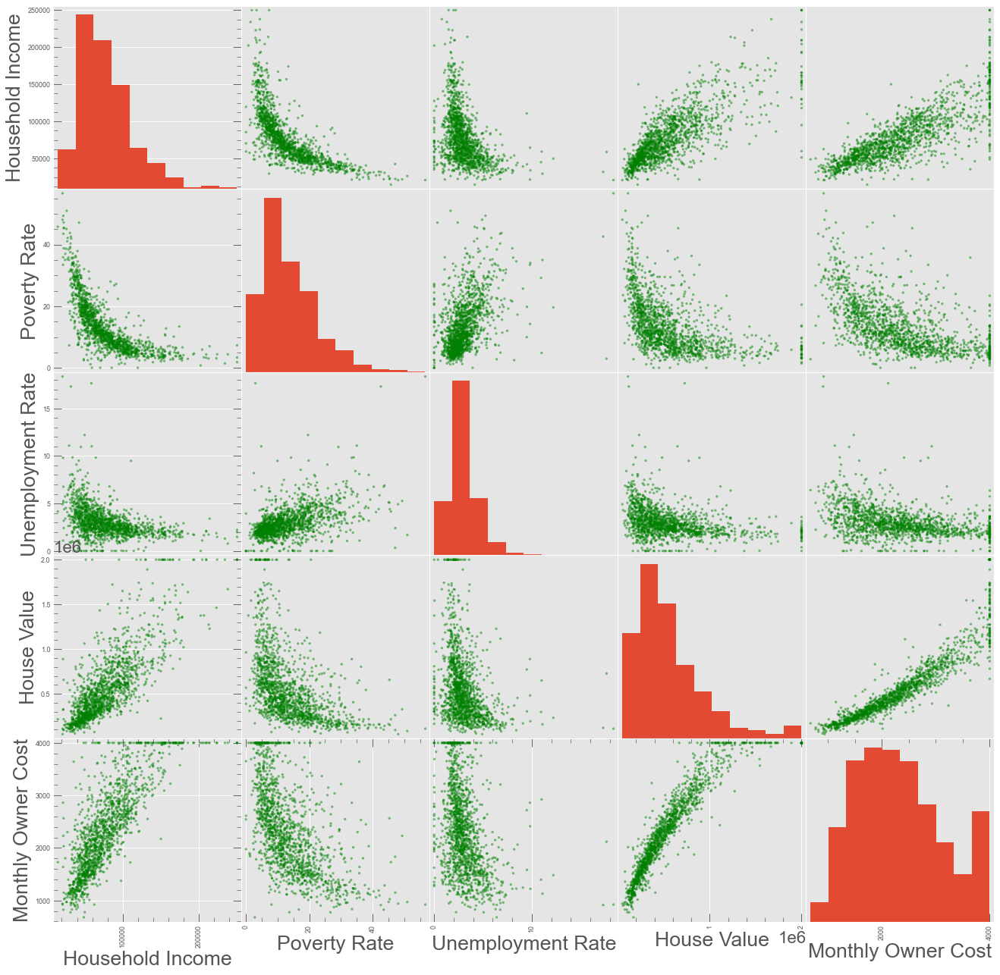

********************************************************************************


In [5]:
# to plot all selected columns
all_datas=[ca_2019]
years=[ '2019']
for i, data in enumerate(all_datas):
    print(f'Scatter Matrix for {years[i]} data')
    col=data[[ 'Household Income',
        'Poverty Rate', 'Unemployment Rate', 'House Value',
        'Monthly Owner Cost', ]]
    pd.plotting.scatter_matrix(col,c='g', figsize=(20,20))
    plt.show()
    print('*'*80)
    

# B. Relationalship of Housing Price with:

## 1. Economy

Plots for 2019


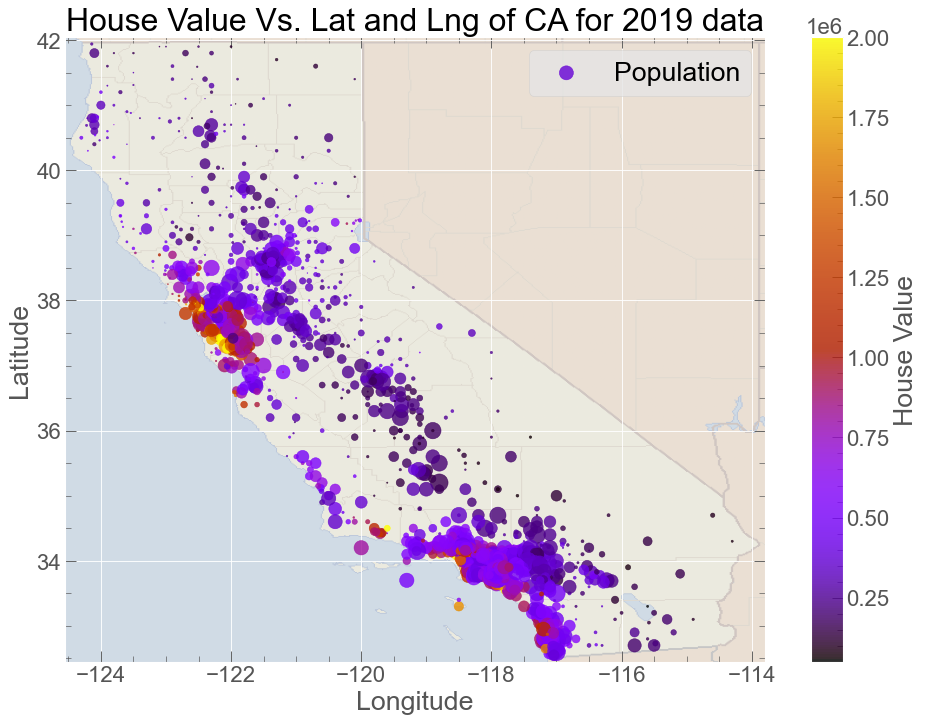

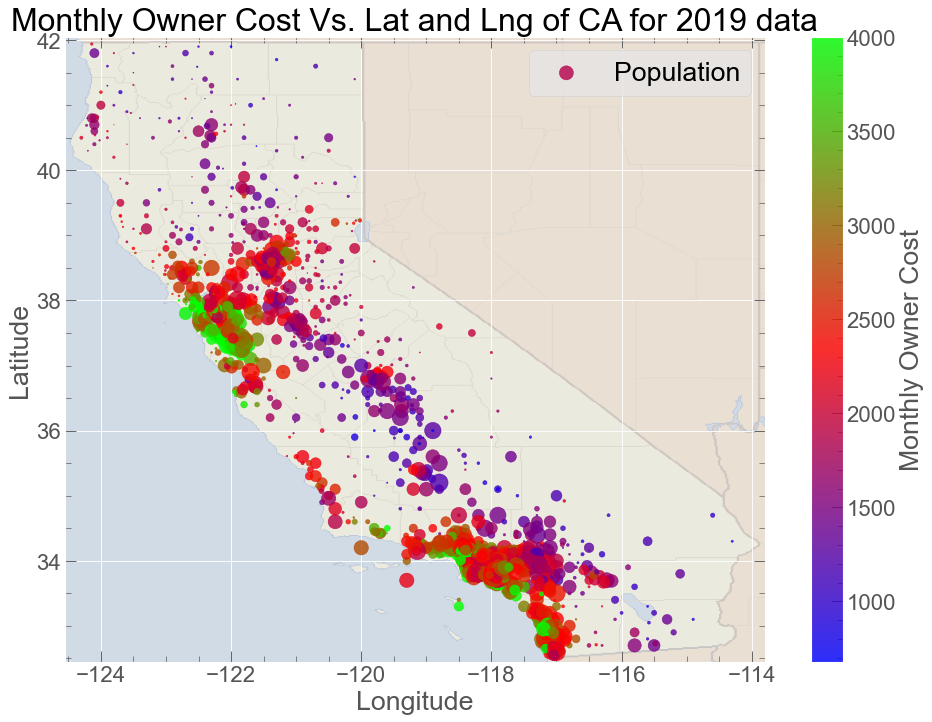

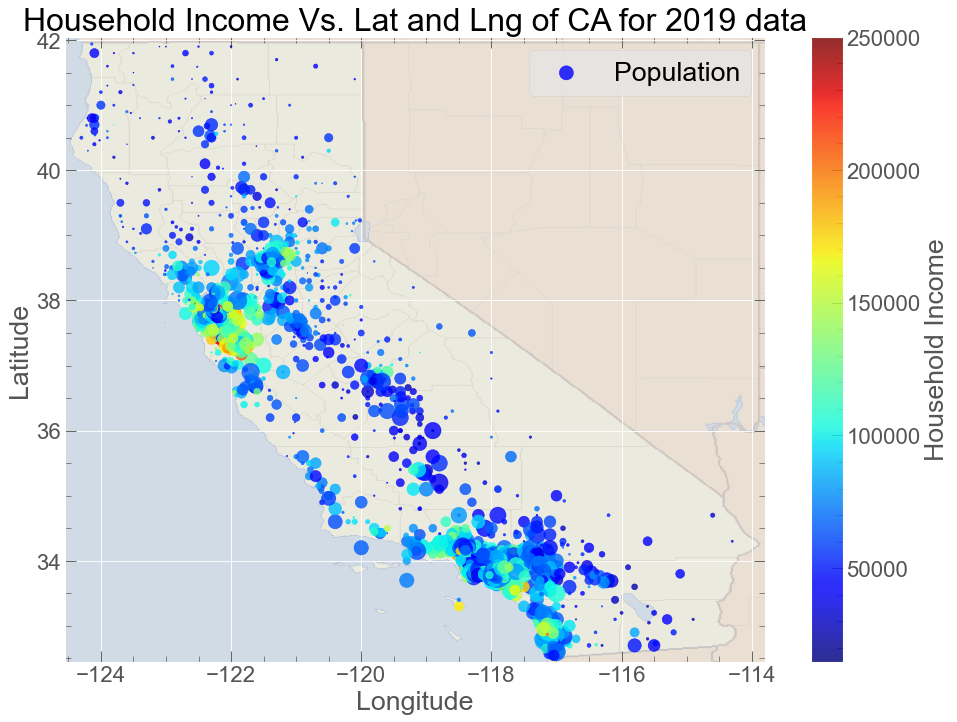

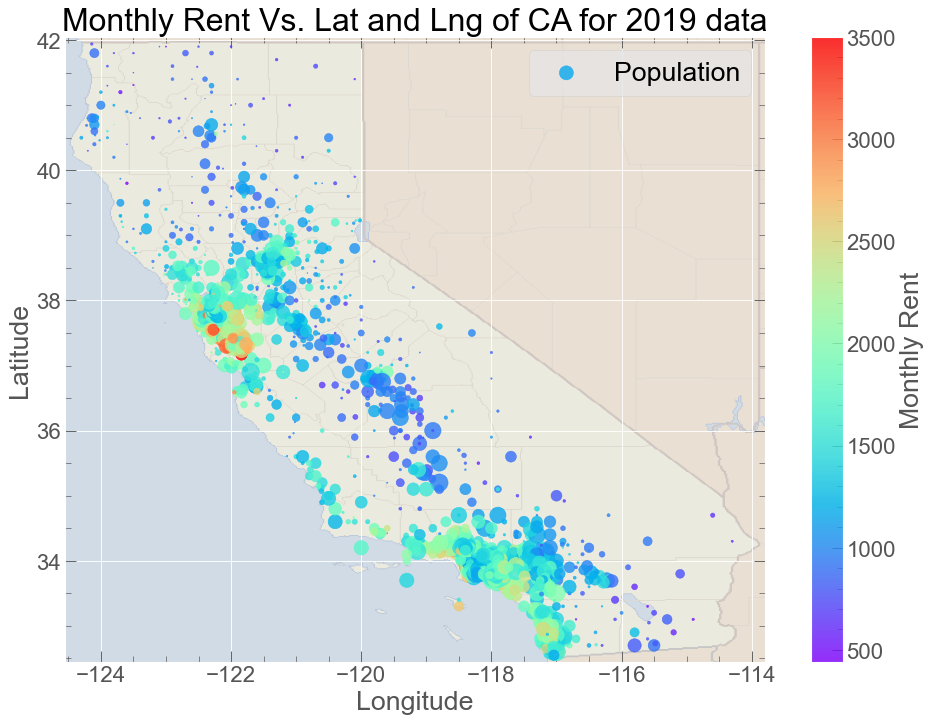

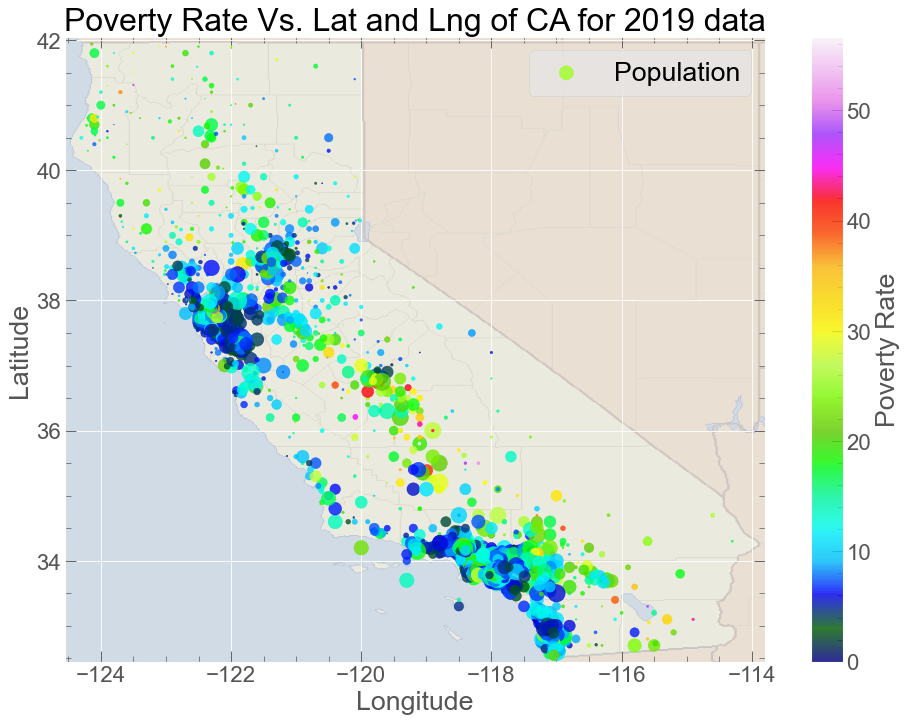

********************************************************************************


In [6]:
#Latitude and Longitude plots of different columns
cali_img=mpimg.imread(os.path.join('Others', 'california.png'))
all_datas=[ca_2019]
years=[ '2019']
cols=['House Value','Monthly Owner Cost','Household Income',
  'Monthly Rent','Poverty Rate']
cmap=['gnuplot', 'brg','jet', 'rainbow', 'gist_ncar']
warnings.filterwarnings("ignore")
for i, data in enumerate(all_datas):
    print(f'Plots for {years[i]}')
    for j in range(1, 6):
        fig = plt.figure(figsize=(15,60))
        ax = fig.add_subplot(5, 1, j)
    
        data.plot(kind='scatter', x='Lng', y='Lat', alpha=0.8, 
                s=data['Population']/350,label='Population',
                 c=cols[j-1], cmap=plt.get_cmap(cmap[j-1]),
                colorbar=True, ax=ax)
        im=ax.imshow(cali_img, extent=[-124.55, -113.80, 32.45, 42.05], alpha=0.3,
           cmap=plt.get_cmap("jet"))
        ax.set_title(f'{cols[j-1]} Vs. Lat and Lng of CA for {years[i]} data')
        ax.set(xlabel="Longitude", ylabel="Latitude")
        fig.savefig(f'figures/lat_Vs_lng_vs_{cols[j-1]}.png', bbox_inches="tight")
        plt.show()
    print('*'*80)
    


#### Scatter plots

Plots for 2019


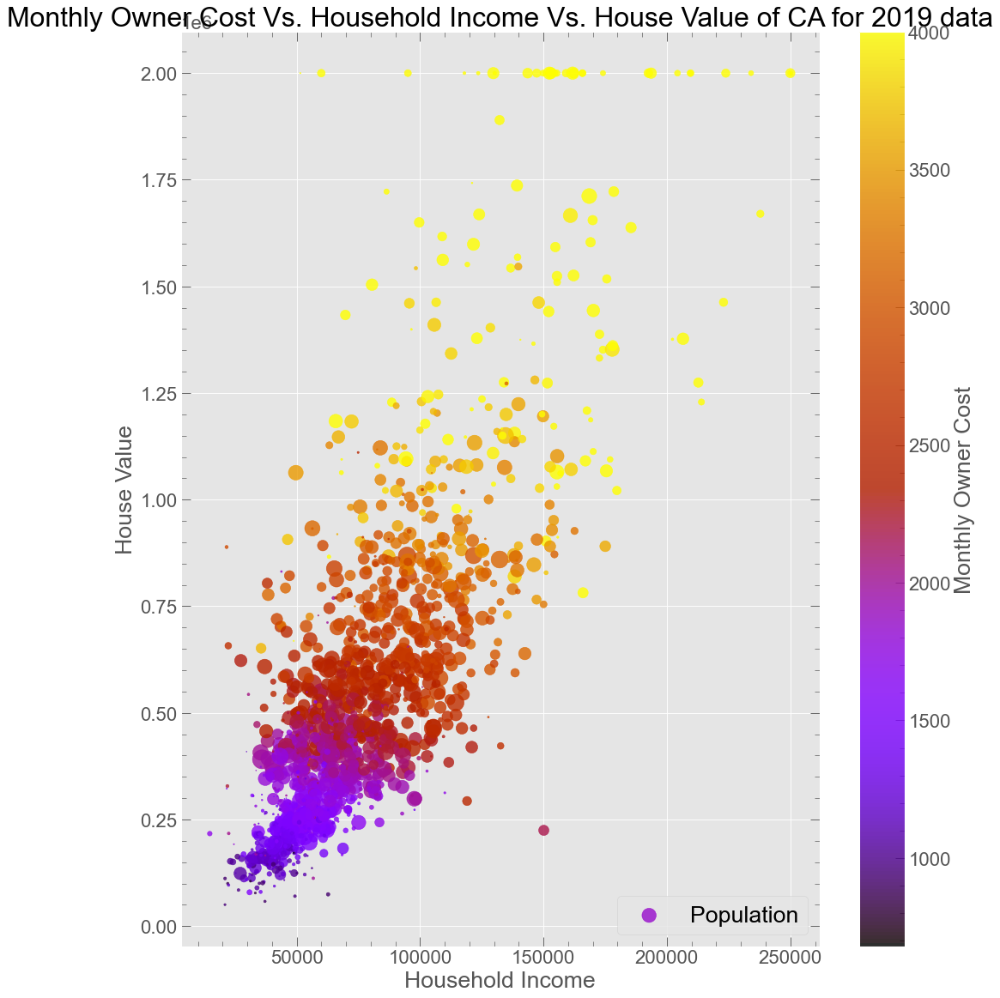

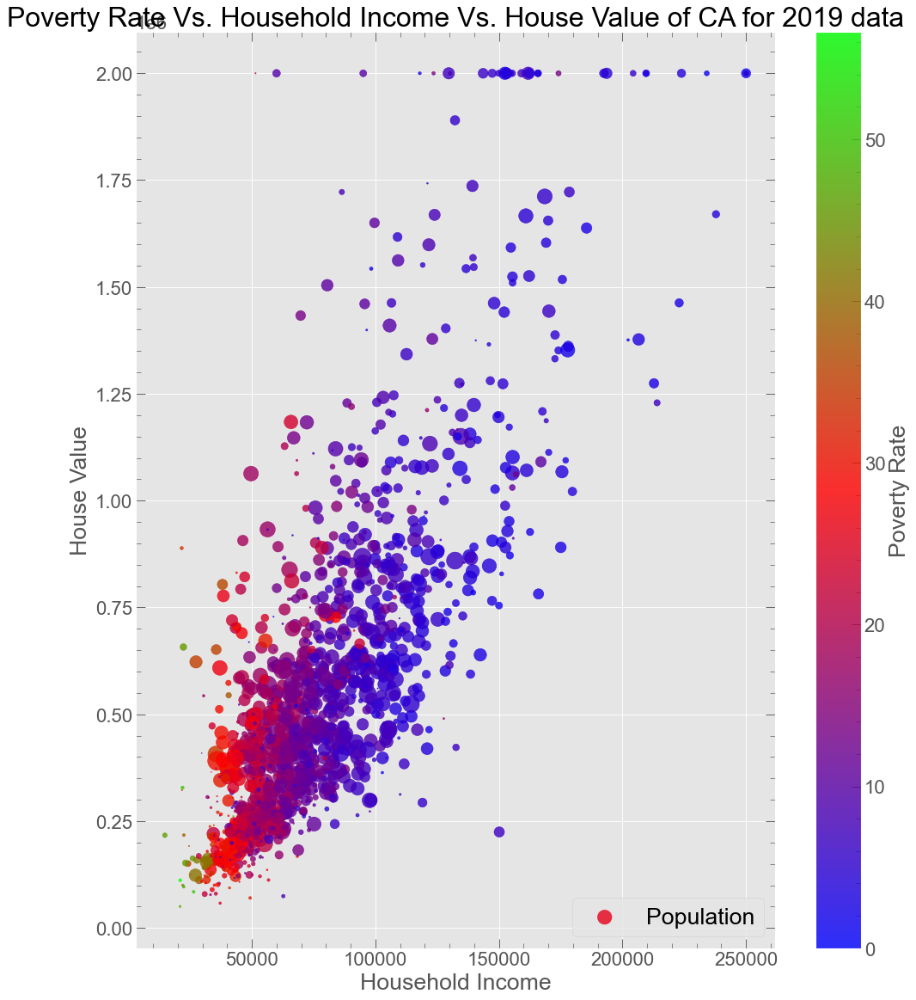

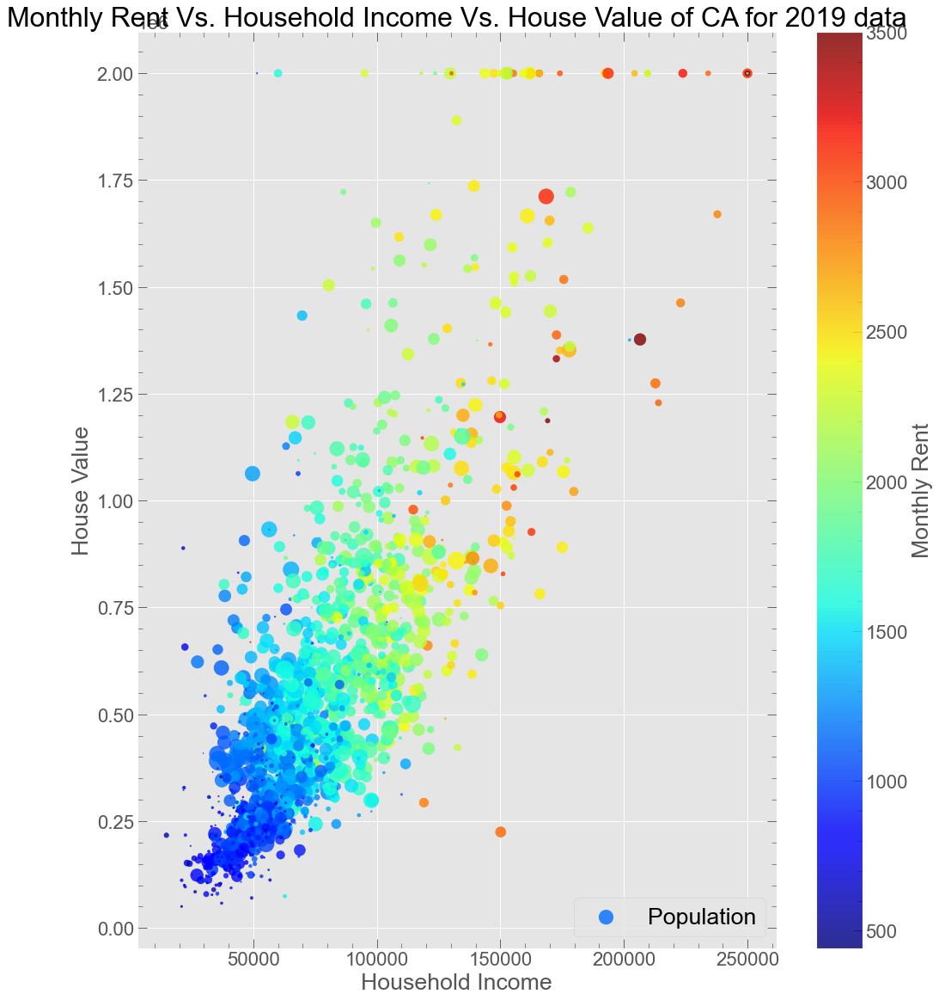

********************************************************************************


In [7]:
#
all_datas=[ca_2019]
years=[ '2019']
cols=['Monthly Owner Cost','Poverty Rate',
  'Monthly Rent']
cmap=['gnuplot', 'brg','jet', 'rainbow', 'gist_ncar']
for i, data in enumerate(all_datas):
    print(f'Plots for {years[i]}')
    for j in range(1, 4):
        fig = plt.figure(figsize=(15,60))
        ax = fig.add_subplot(3, 1, j)
    
        data.plot(kind='scatter', x='Household Income', y='House Value', alpha=0.8, 
                s=data['Population']/250,label='Population',
                 c=cols[j-1], cmap=plt.get_cmap(cmap[j-1]),
                colorbar=True, ax=ax)

        ax.set_title(f'{cols[j-1]} Vs. Household Income Vs. House Value of CA for {years[i]} data')
        fig.savefig(f'figures/HV_VS_HI_{cols[j-1]}.png', bbox_inches="tight")
        plt.show()
    print('*'*80)


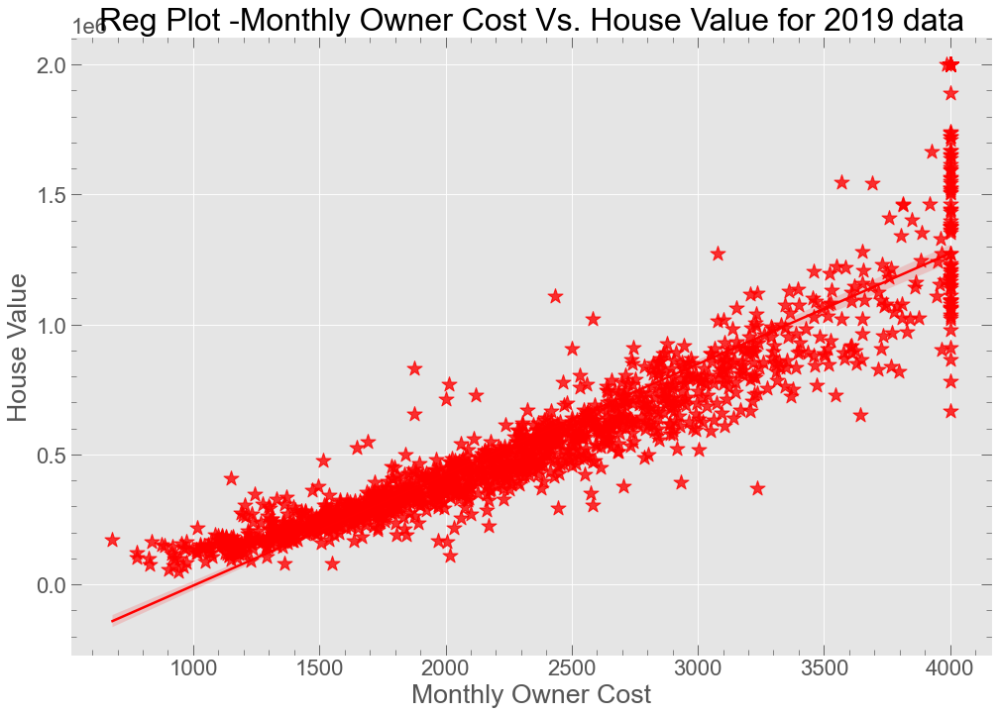

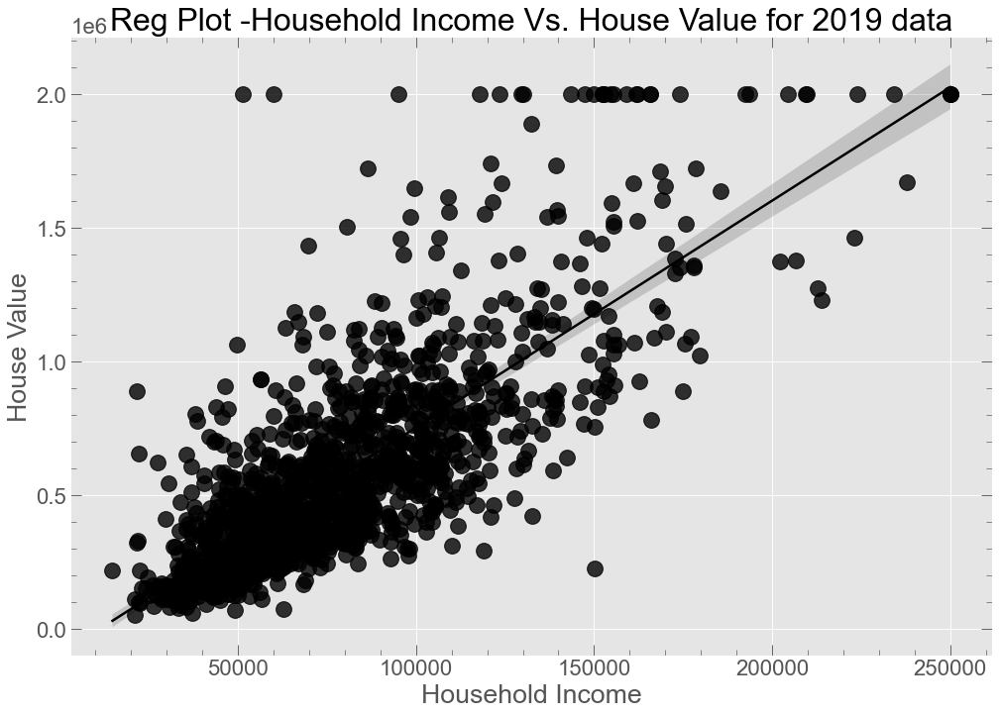

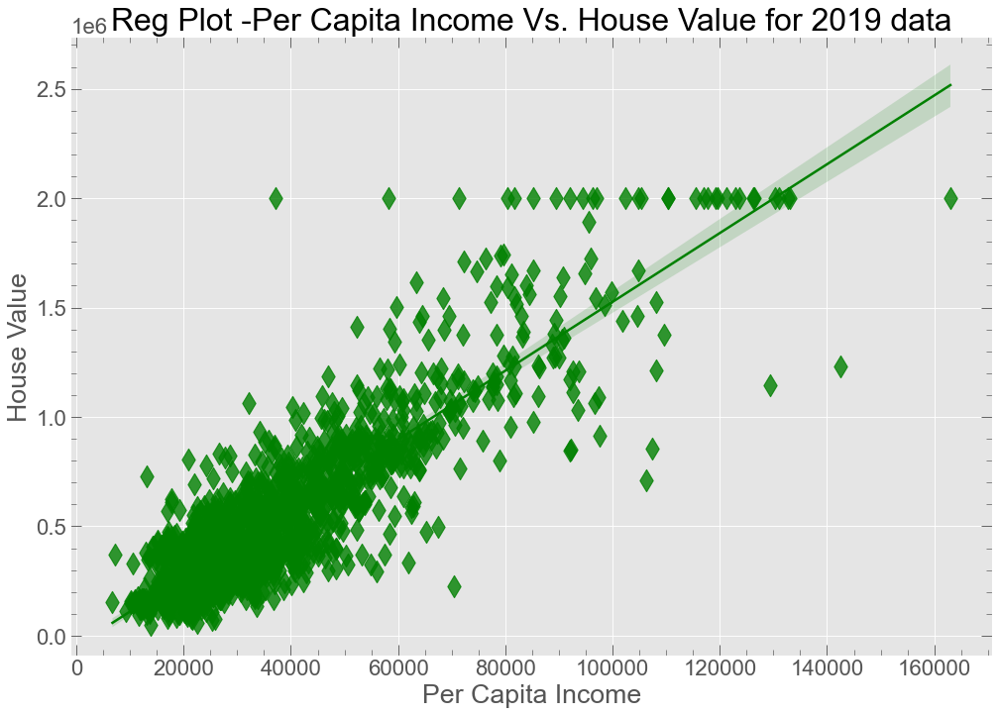

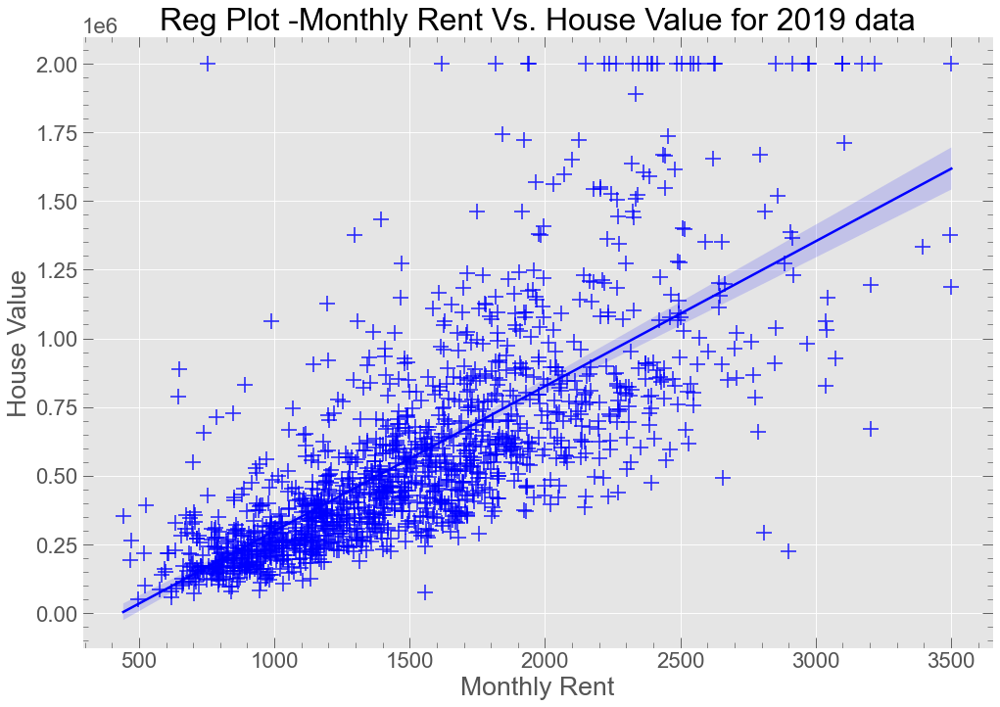

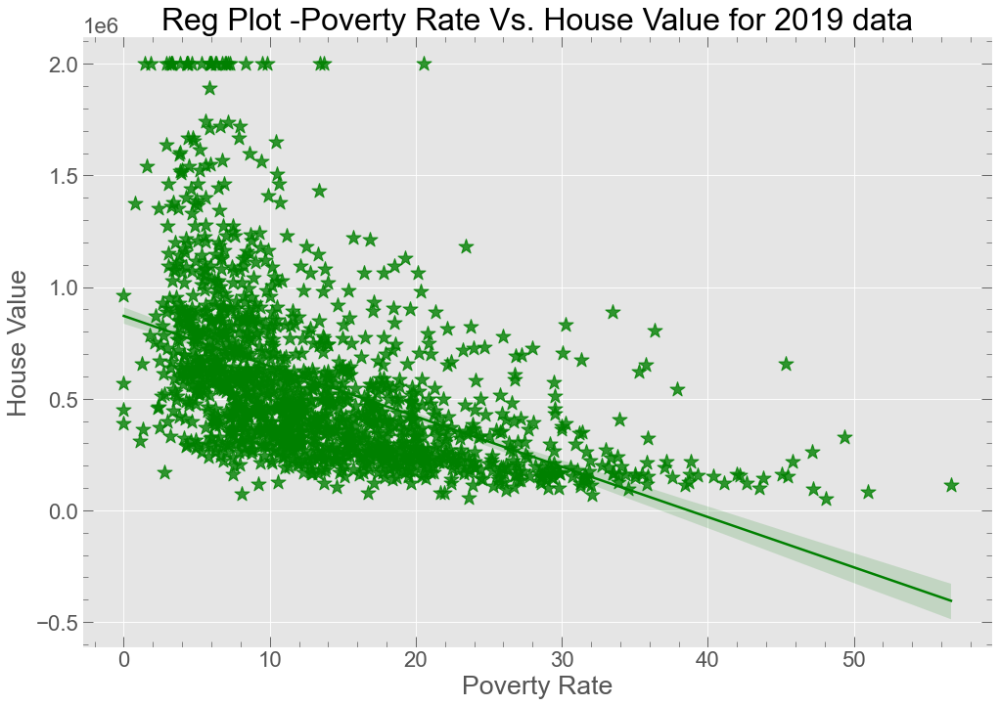

In [8]:
#scatter plots
cols=['Monthly Owner Cost','Household Income','Per Capita Income',
  'Monthly Rent','Poverty Rate',]
marker=["*","o","d","+","*","d",'+']
color=['r','k','g','b','g','y','b']

for j in range(1, 6):
    fig = plt.figure(figsize=(15,60))
    ax = fig.add_subplot(5, 1, j)
    
    sns.regplot(x=cols[j-1], y='House Value',
           data=ca_2019,color=color[j-1],marker=marker[j-1],
            scatter_kws={'s':200},ax=ax)

    ax.set_xlabel(f'{cols[j-1]}')
    ax.set_ylabel('House Value')
    ax.set_title(f'Reg Plot -{cols[j-1]} Vs. House Value for 2019 data')
    fig.savefig(f'figures/{cols[j-1]}_Vs.HouseValue.png', bbox_inches="tight")
    plt.show()



### Barplots of CA County

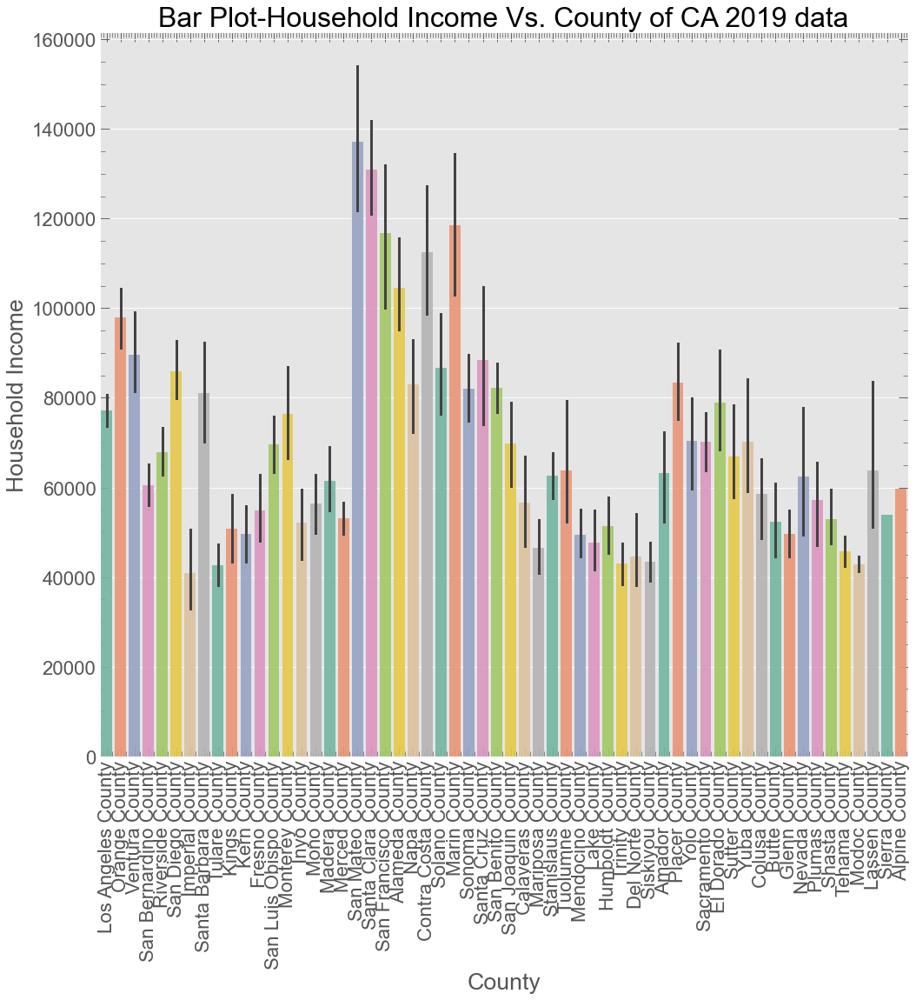

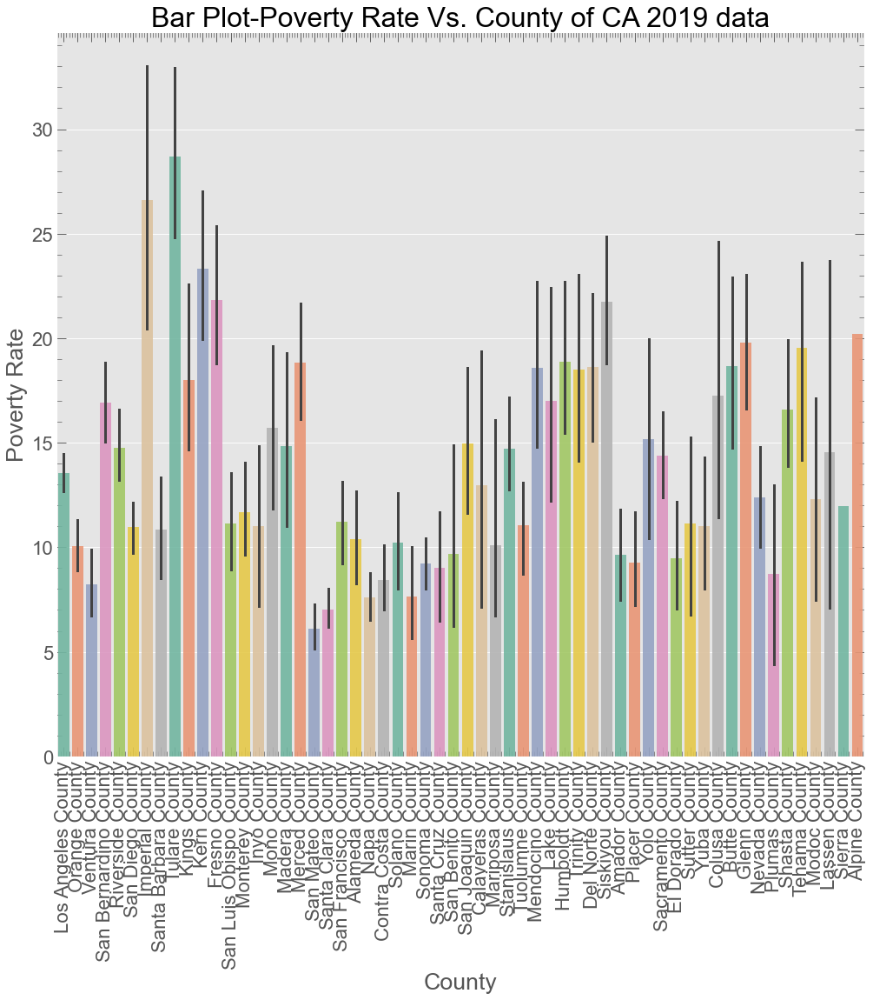

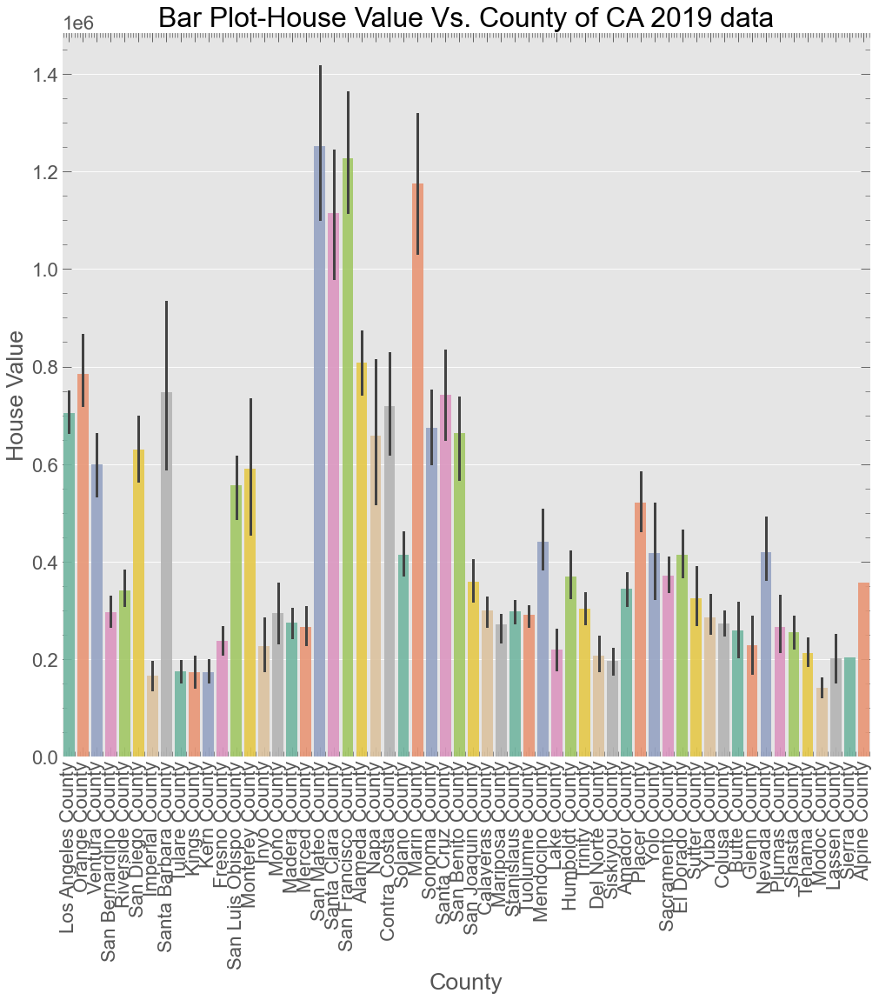

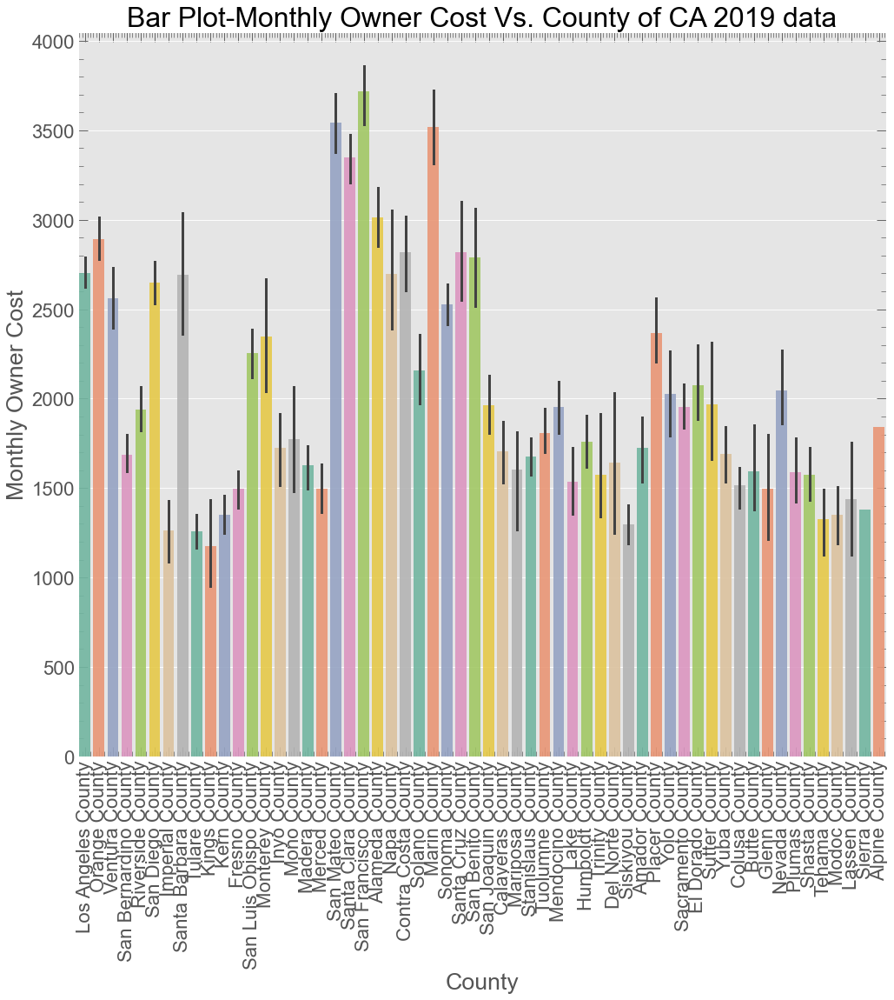

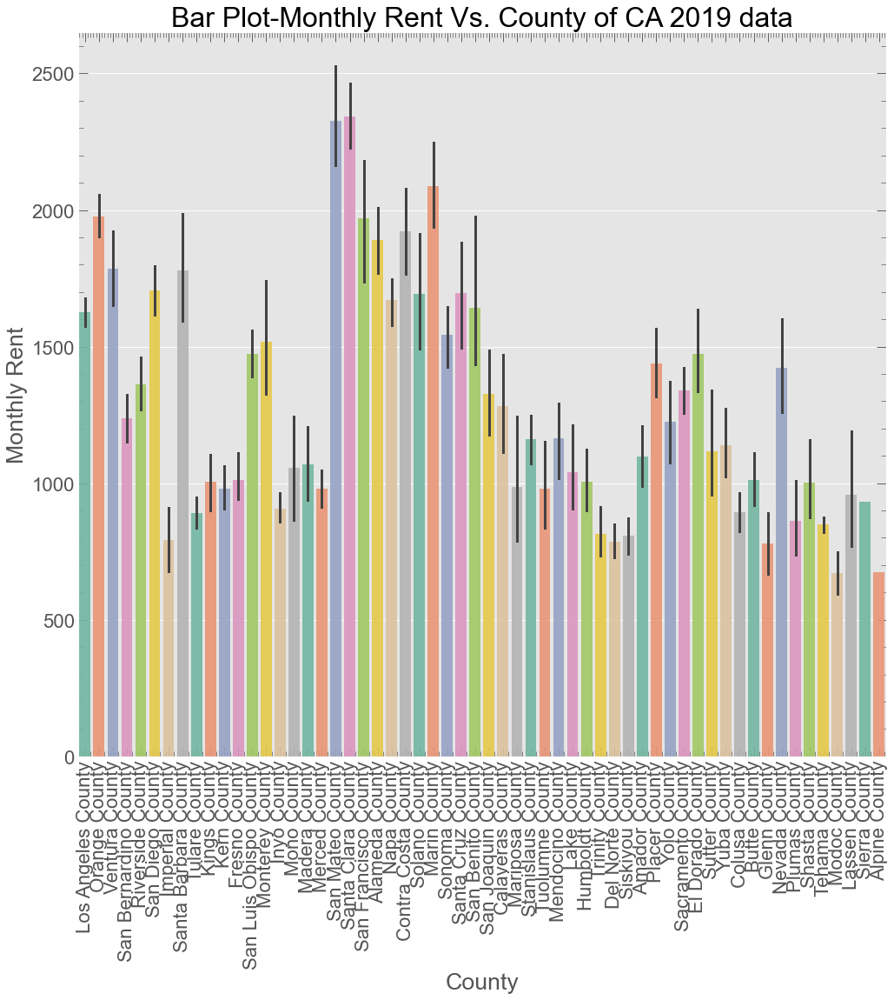

********************************************************************************


In [9]:

cols=[ 'Household Income','Poverty Rate', 'House Value',
       'Monthly Owner Cost', 'Monthly Rent']

for j in range(1, 6):
    fig = plt.figure(figsize=(15,80))
    ax = fig.add_subplot(5, 1, j)

    sns.barplot(x='County', y=cols[j-1],
        data=ca_2019, alpha=0.9, palette="Set2",label = "2019",ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_ylabel(f'{cols[j-1]}')
    ax.set_xlabel('County')
    ax.set_title(f'Bar Plot-{cols[j-1]} Vs. County of CA 2019 data')
    fig.savefig(f'figures/Barplot_{cols[j-1]}_Vs.County.png', bbox_inches="tight")
    plt.show()
print('*'*80)


### Boxplots of CA County Economy data

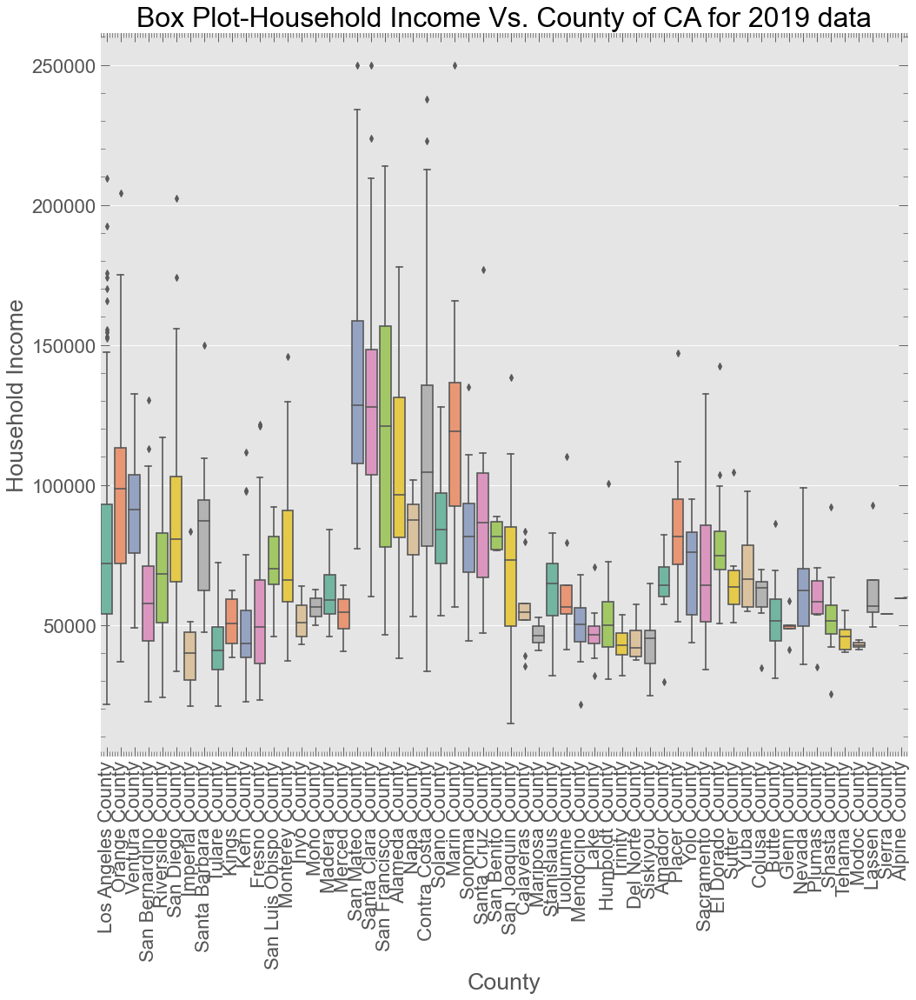

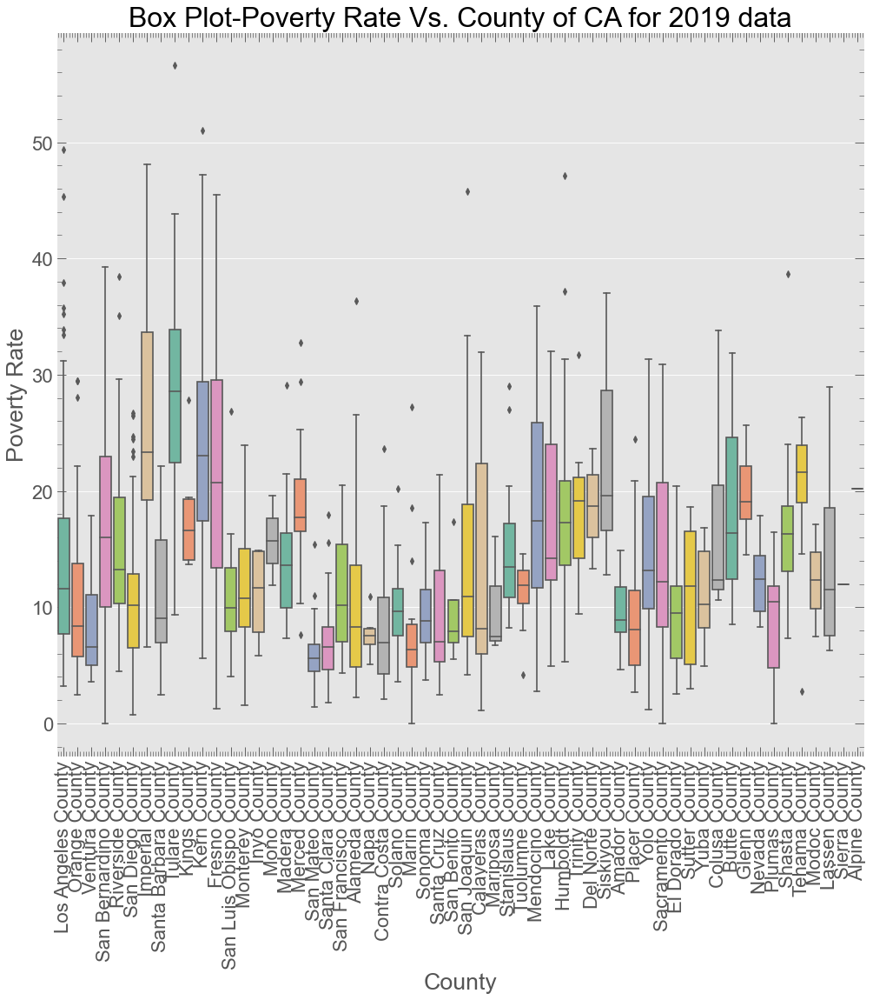

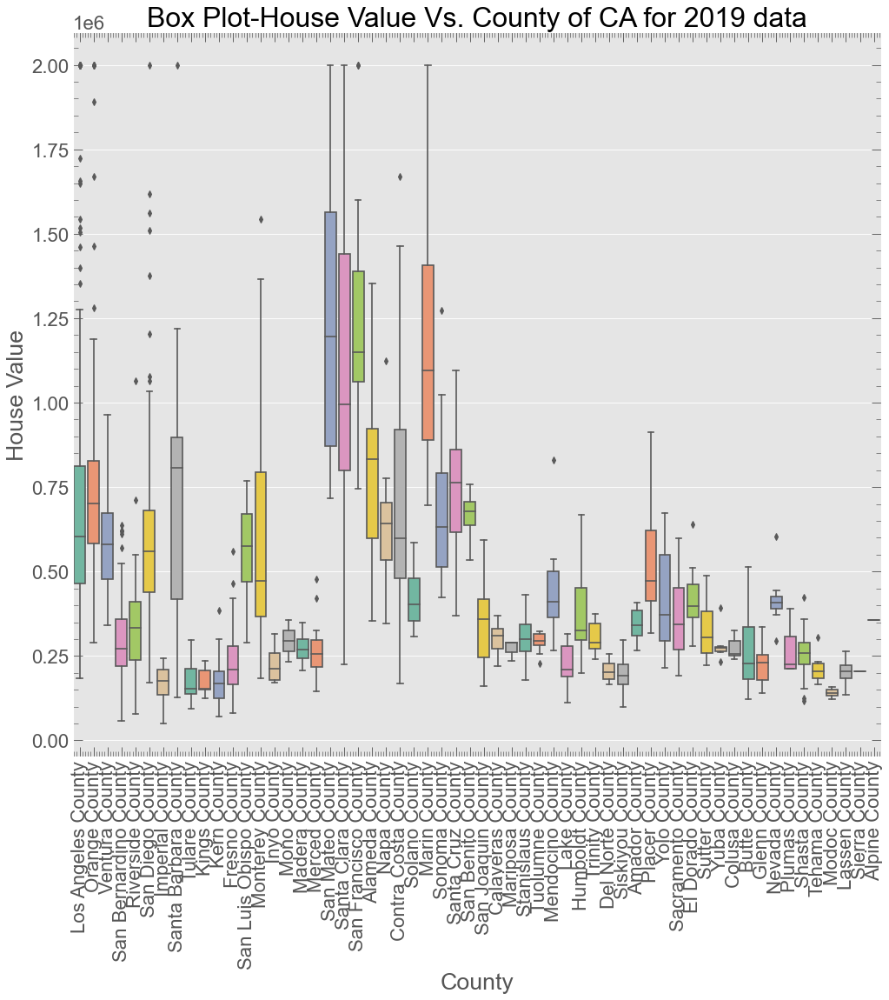

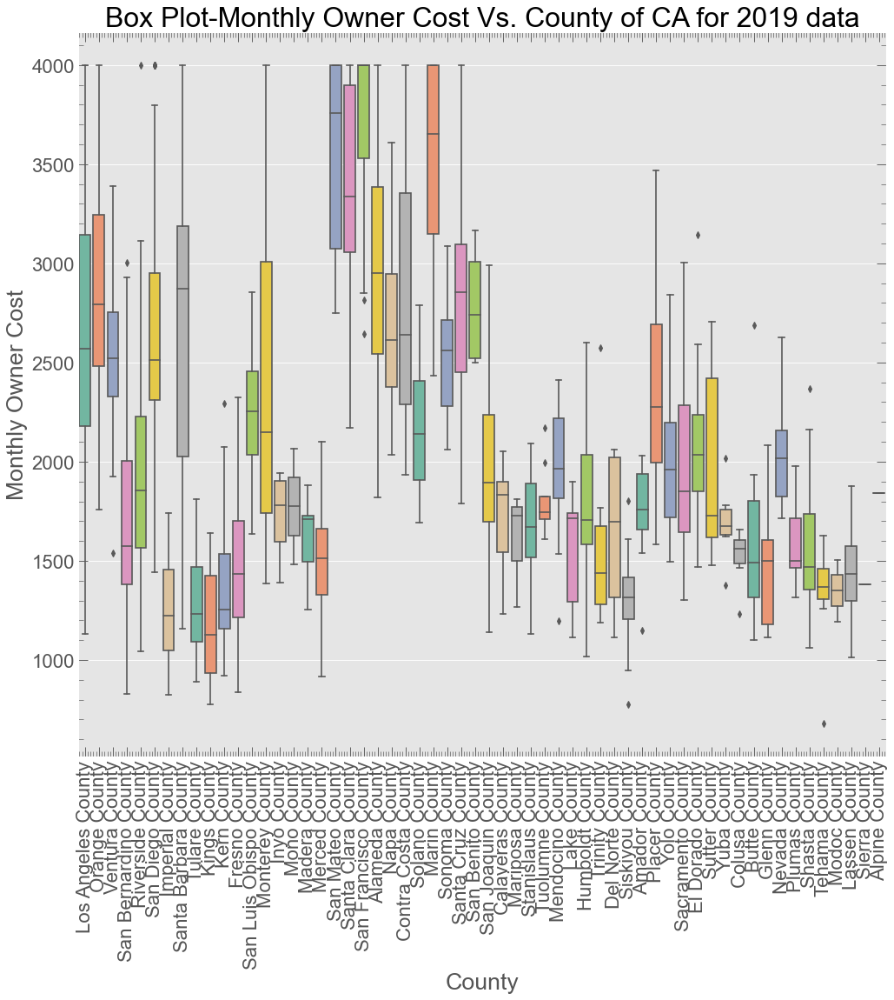

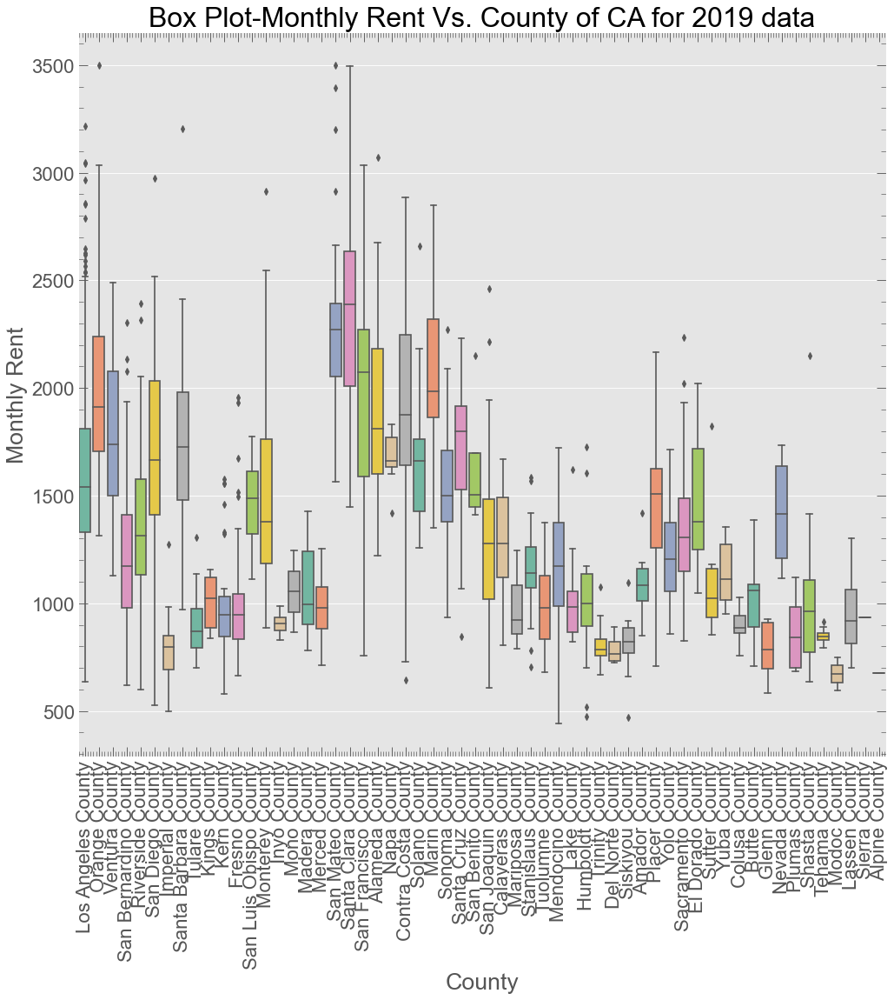

********************************************************************************


In [10]:

cols=[ 'Household Income','Poverty Rate', 'House Value',
       'Monthly Owner Cost', 'Monthly Rent']
  
for j in range(1, 6):
    fig = plt.figure(figsize=(15,80))
    ax = fig.add_subplot(5, 1, j)

    sns.boxplot(x='County', y=cols[j-1],
            data=ca_2019,  palette="Set2",ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_ylabel(f'{cols[j-1]}')
    ax.set_xlabel('County')
    ax.set_title(f'Box Plot-{cols[j-1]} Vs. County of CA for 2019 data')
    fig.savefig(f'figures/Boxplot_{cols[j-1]}_Vs.County.png', bbox_inches="tight")
    plt.show()
print('*'*80)



## 2. Education

Plots for 2019


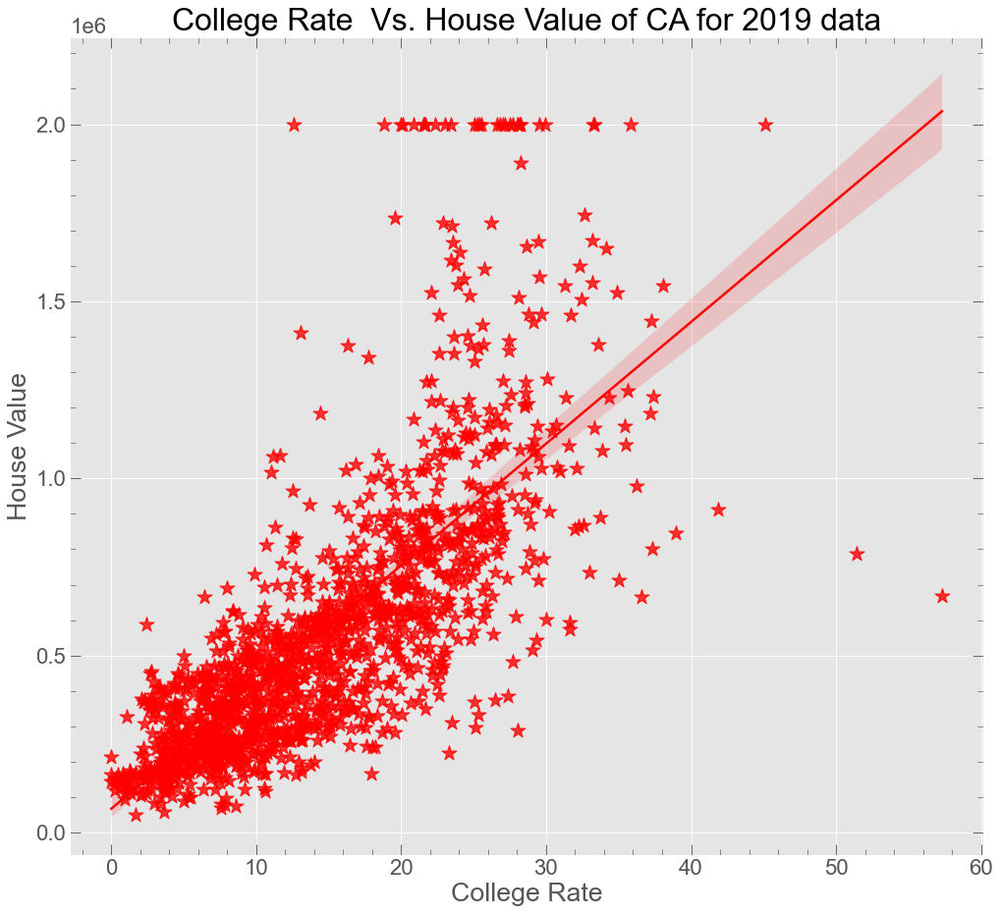

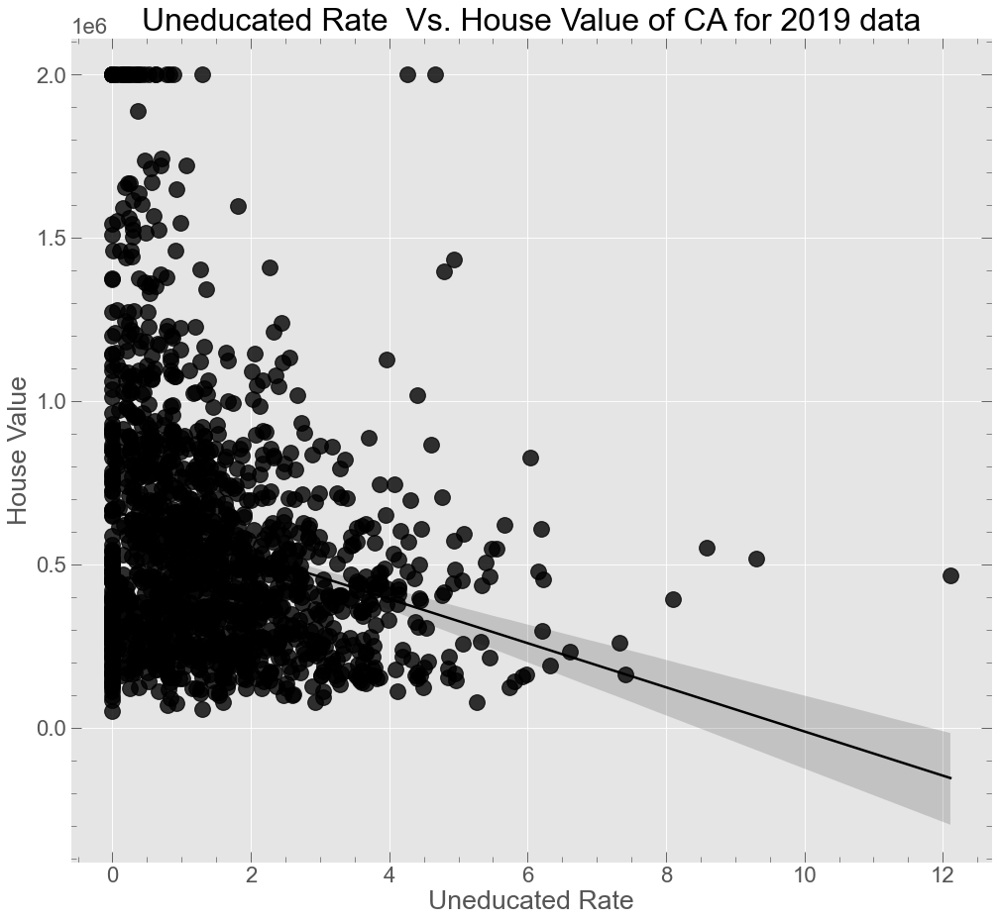

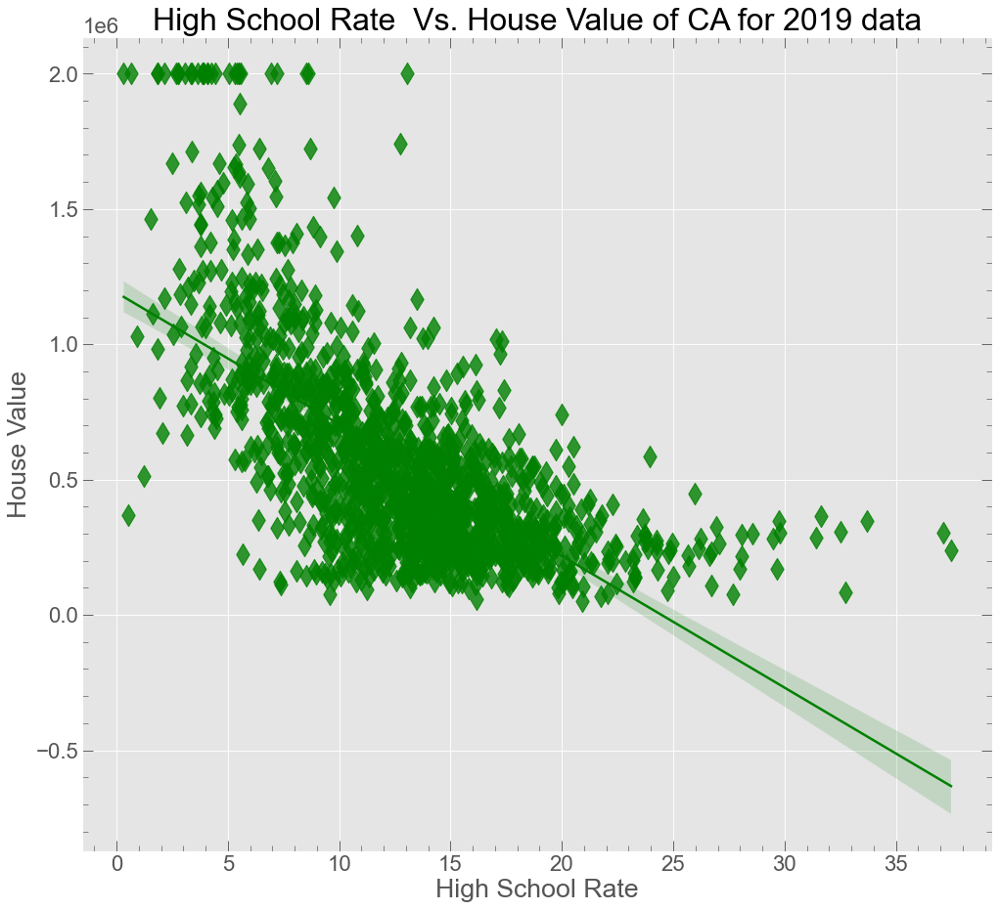

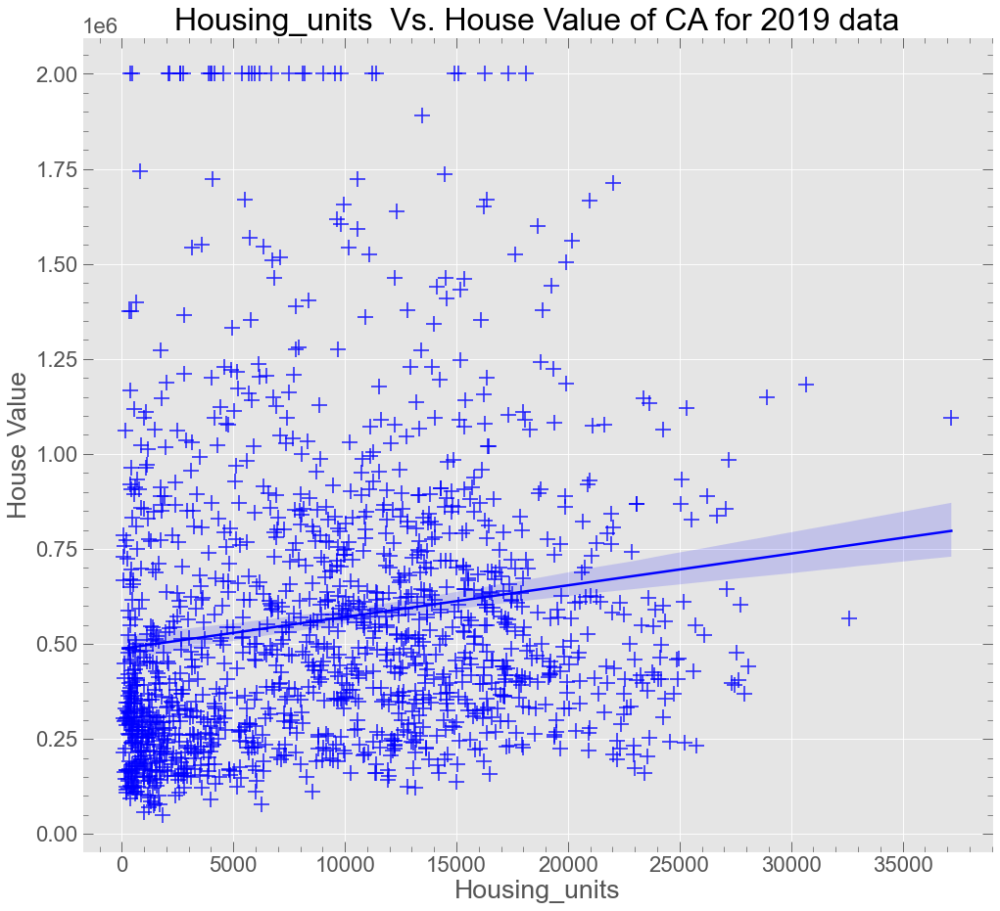

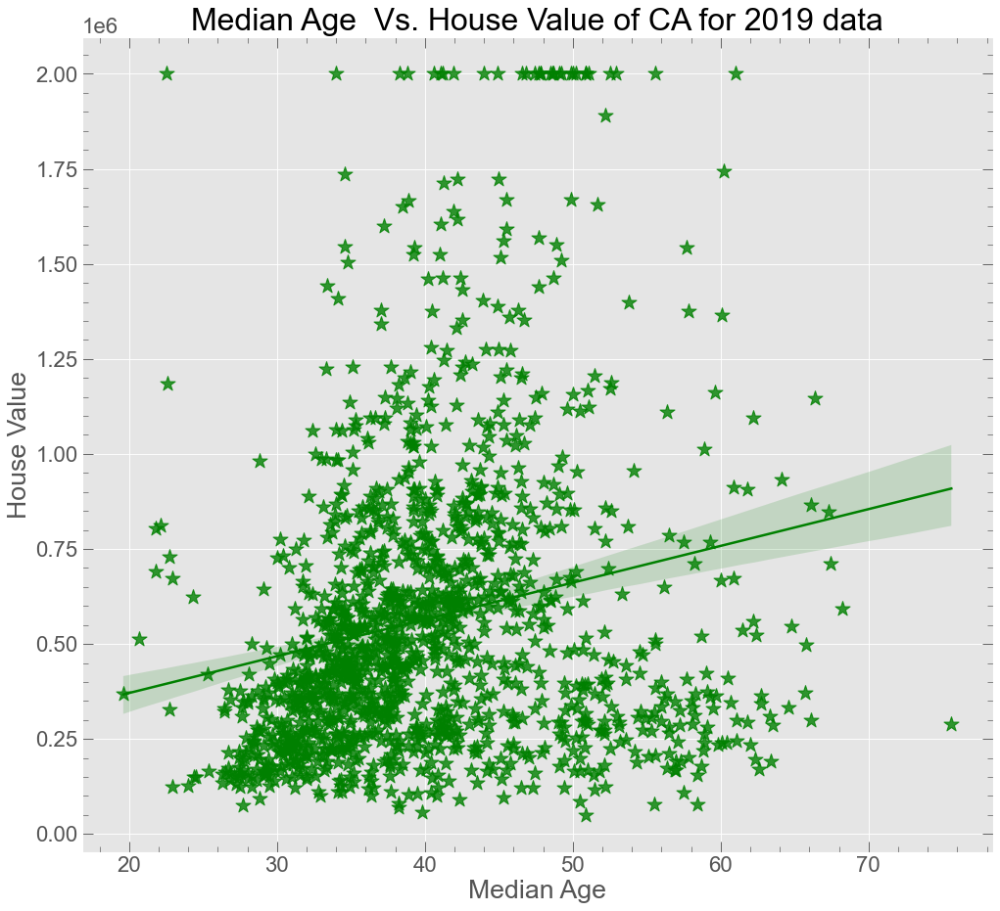

********************************************************************************


In [11]:
#scatter plot
all_datas=[ ca_2019]
years=['2019']
cols=['College Rate', 'Uneducated Rate','High School Rate','Housing_units',
     'Median Age']
c=['r', 'b','g', 'y', 'm','c','k']
for i, data in enumerate(all_datas):
    print(f'Plots for {years[i]}')
    for j in range(1, 6):
        fig = plt.figure(figsize=(15,80))
        ax = fig.add_subplot(5, 1, j)
    
        sns.regplot(x=cols[j-1], y='House Value',
           data=data,color=color[j-1],marker=marker[j-1],
            scatter_kws={'s':200},ax=ax)

        ax.set_title(f'{cols[j-1]}  Vs. House Value of CA for 2019 data')
        fig.savefig(f'figures/HouseValue_vs_{cols[j-1]}.png', 
                   bbox_inches="tight")
        plt.show()
    print('*'*80)

### Boxplots of CA County Education data

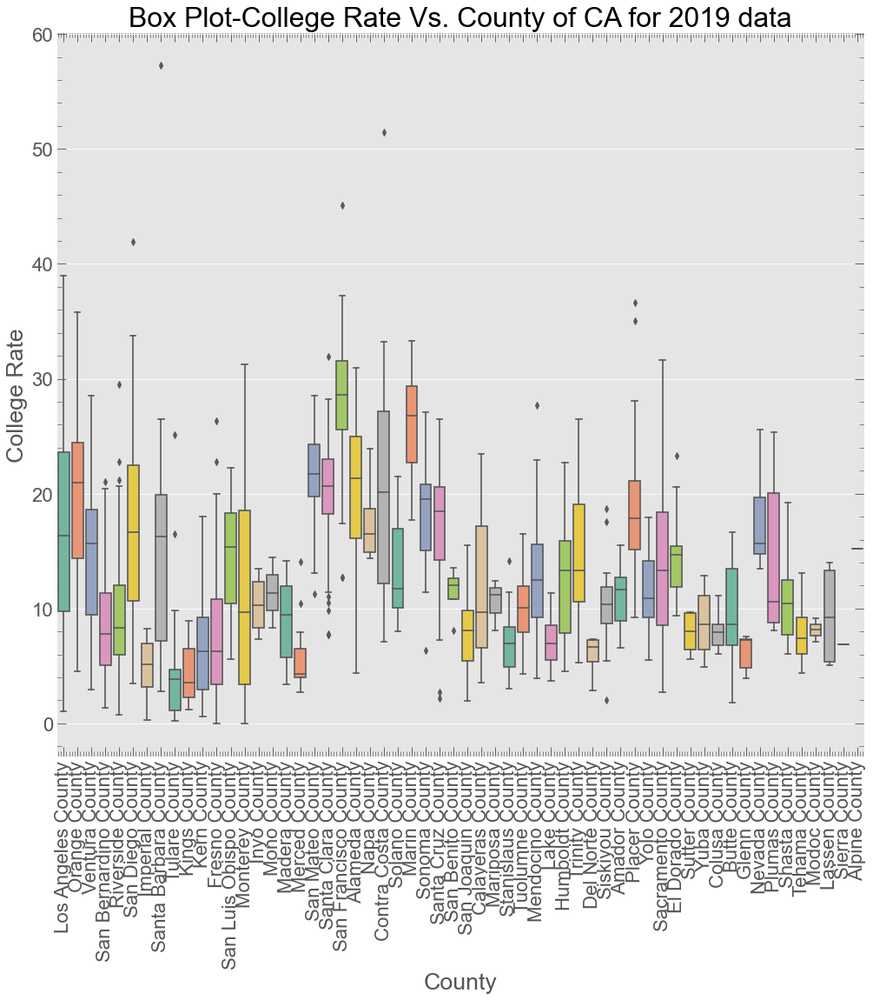

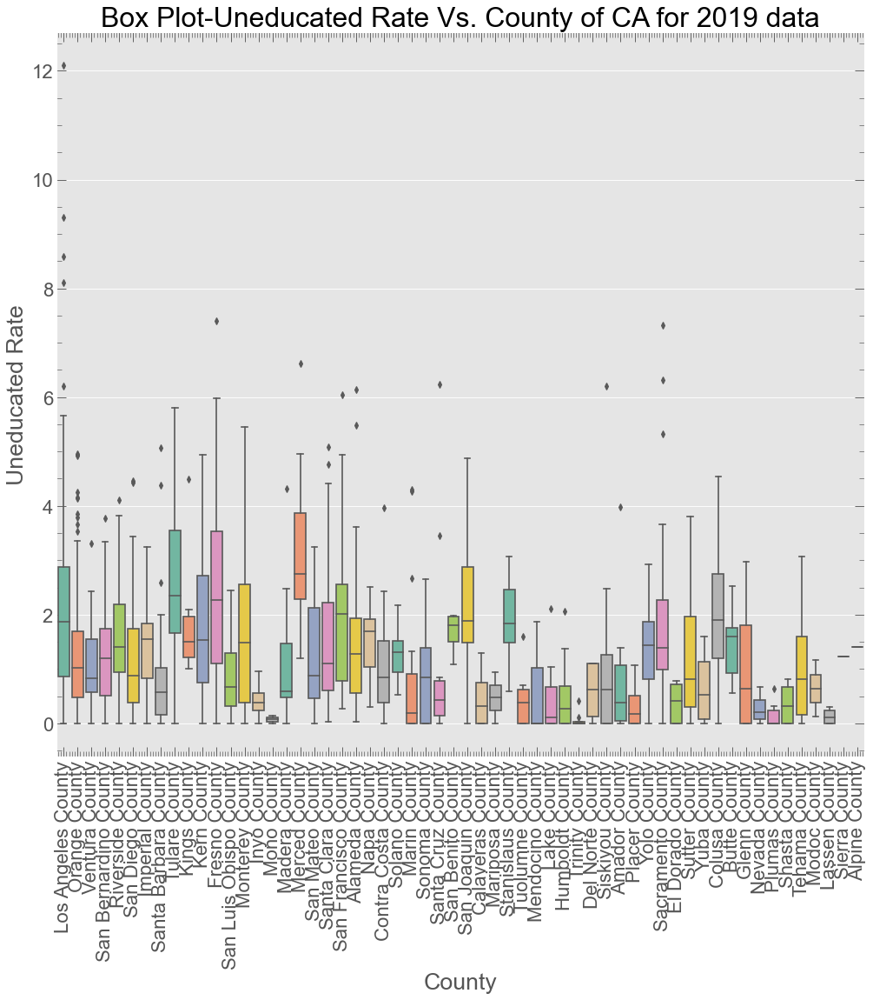

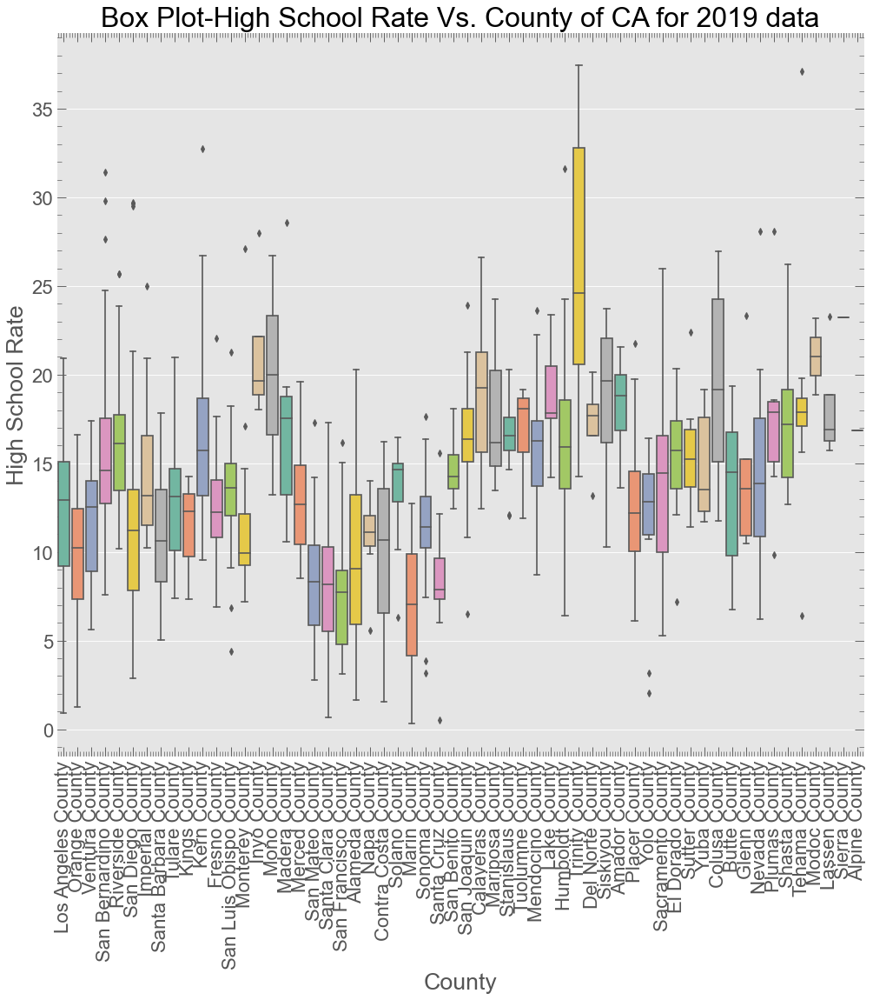

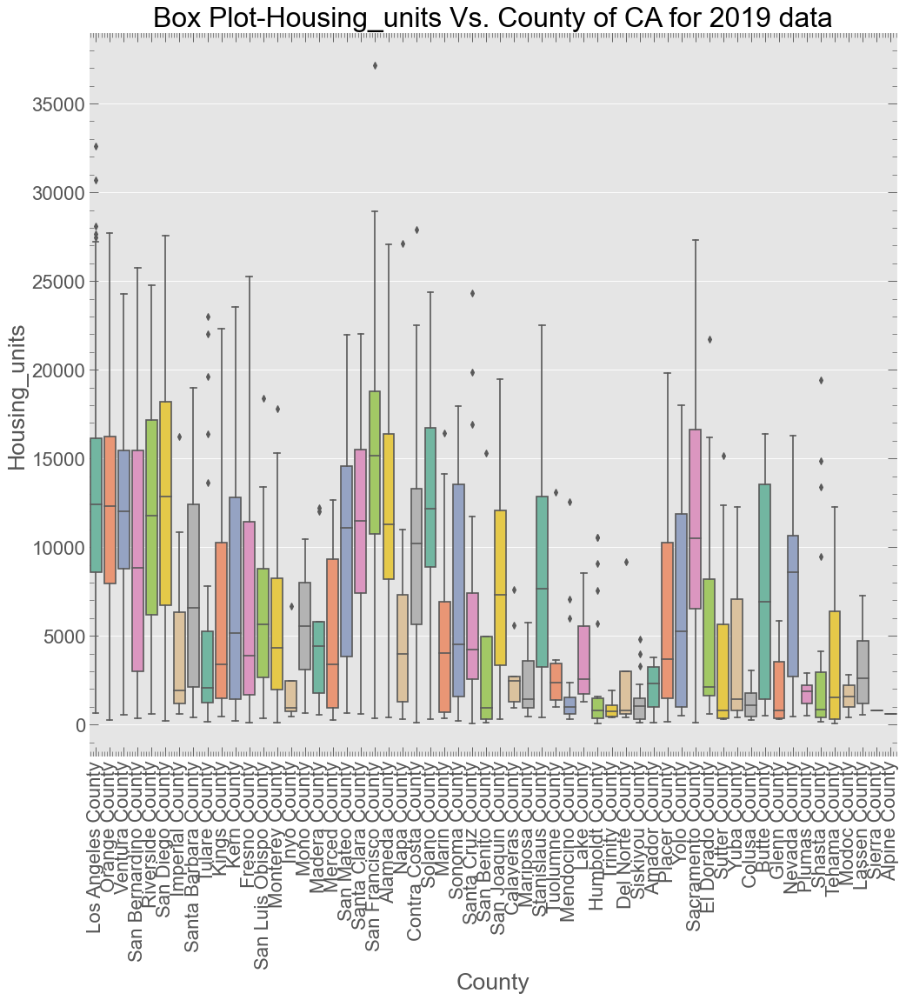

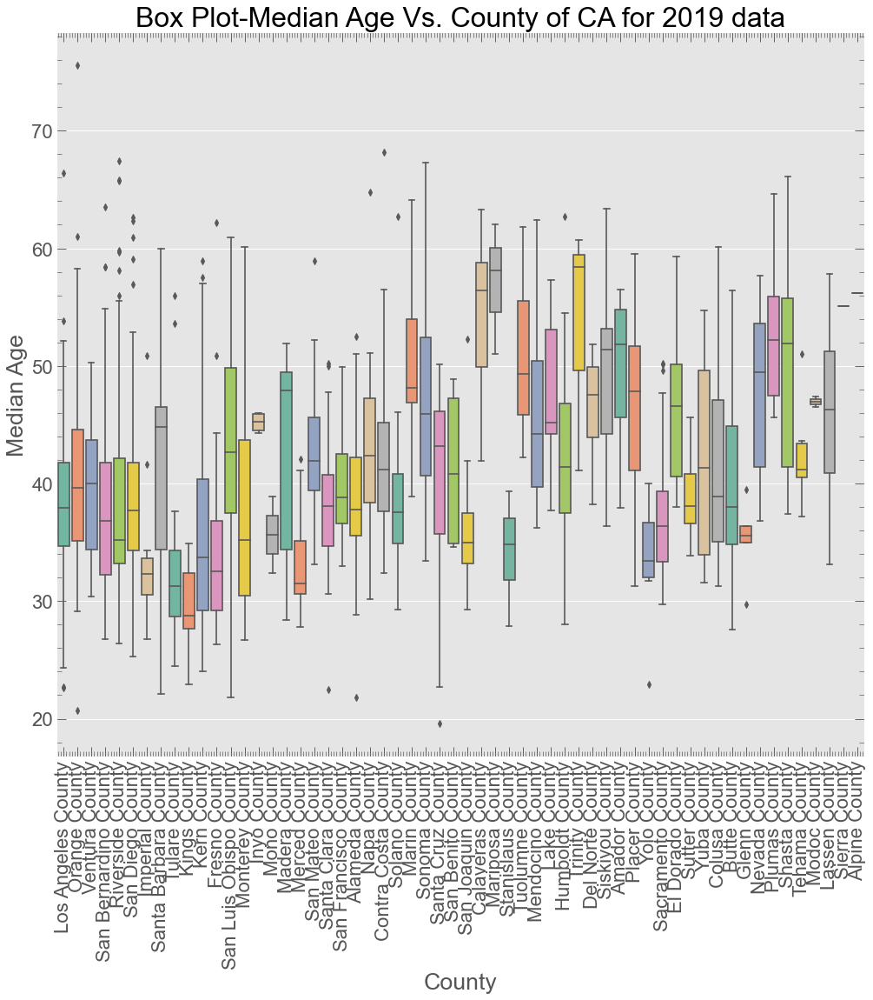

********************************************************************************


In [12]:

cols=['College Rate', 'Uneducated Rate','High School Rate','Housing_units',
     'Median Age']
  
for j in range(1, 6):
    fig = plt.figure(figsize=(15,80))
    ax = fig.add_subplot(5, 1, j)

    sns.boxplot(x='County', y=cols[j-1],
            data=ca_2019,  palette="Set2",ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_ylabel(f'{cols[j-1]}')
    ax.set_xlabel('County')
    ax.set_title(f'Box Plot-{cols[j-1]} Vs. County of CA for 2019 data')
    fig.savefig(f'figures/Boxplot_{cols[j-1]}_Vs.County.png', bbox_inches="tight")
    plt.show()
print('*'*80)



### Educated and uneducated population in CA

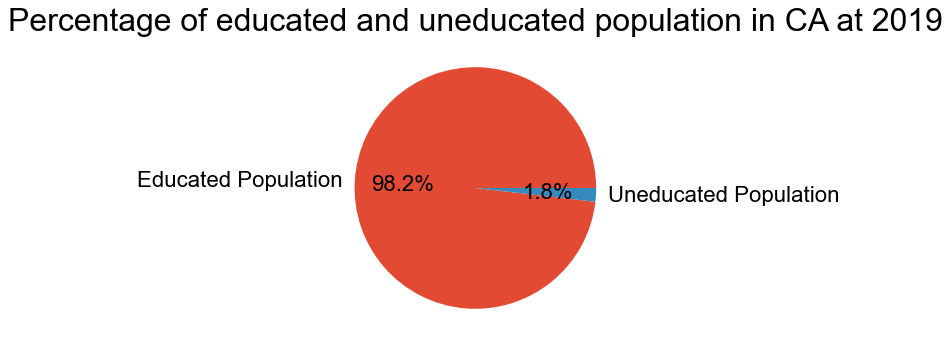

In [13]:
#Percentage of educated and uneducated population in CA
all_datas=[ca_2019]
for i, data in enumerate(all_datas):
    ca_total_population=data['Population'].sum()
    ca_uneducated=((data['Population']*data["Uneducated Rate"])/100).sum(axis=0)
    ca_educated=(ca_total_population-ca_uneducated)
    plt.figure(figsize=(5,5))
    slices=[ca_educated,ca_uneducated]
    labels=["Educated Population","Uneducated Population"]
    plt.pie(slices,labels=labels,autopct="%1.1f%%")
    plt.title("Percentage of educated and uneducated population in CA at 2019")
    #plt.tight_layout()
    plt.show()

## 3. Transportation

Plots for 2019


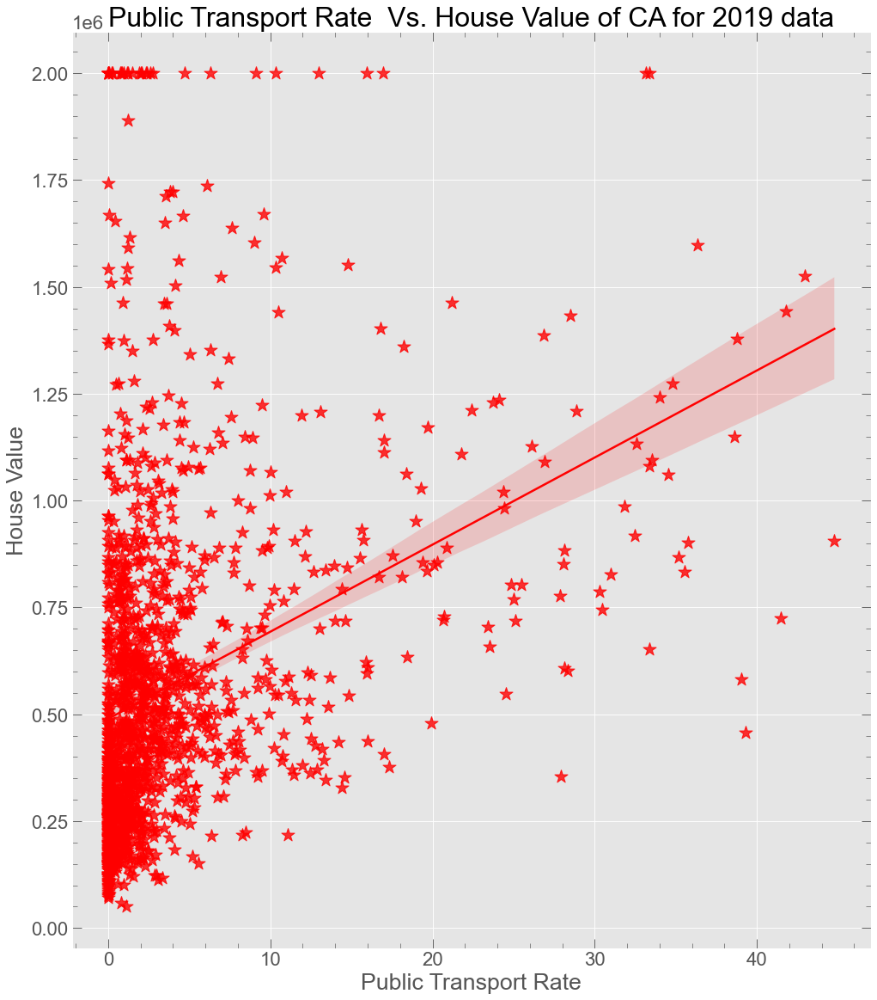

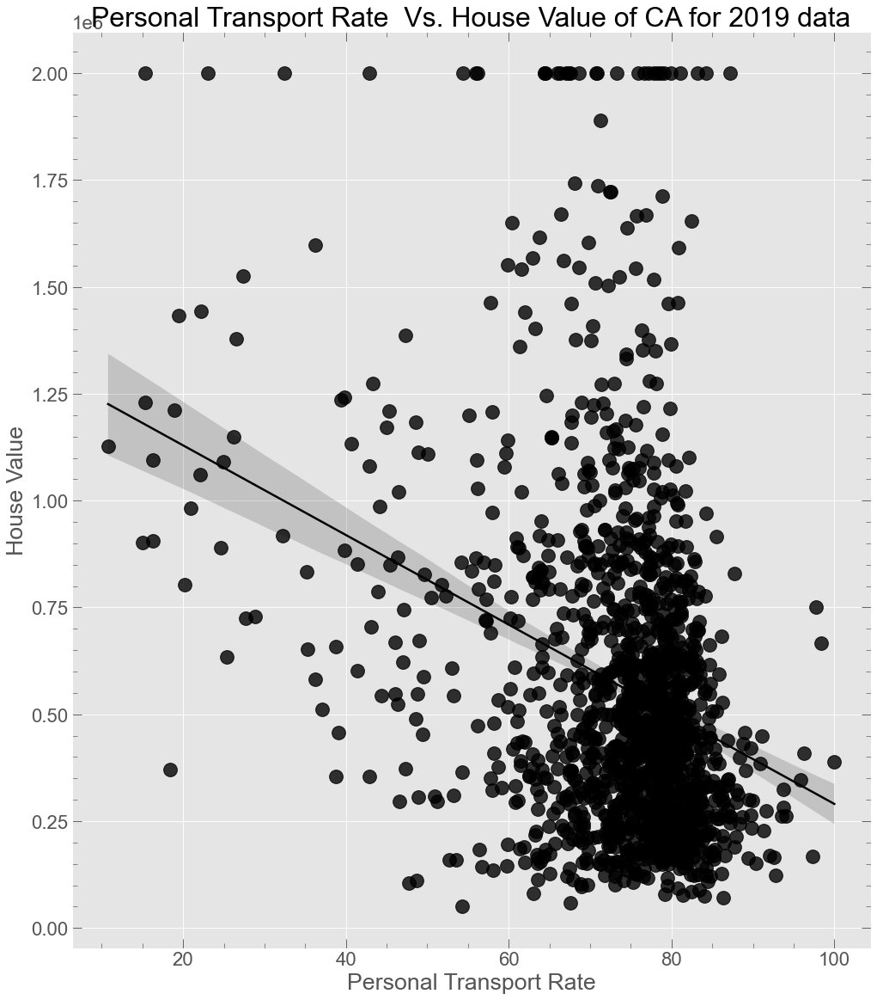

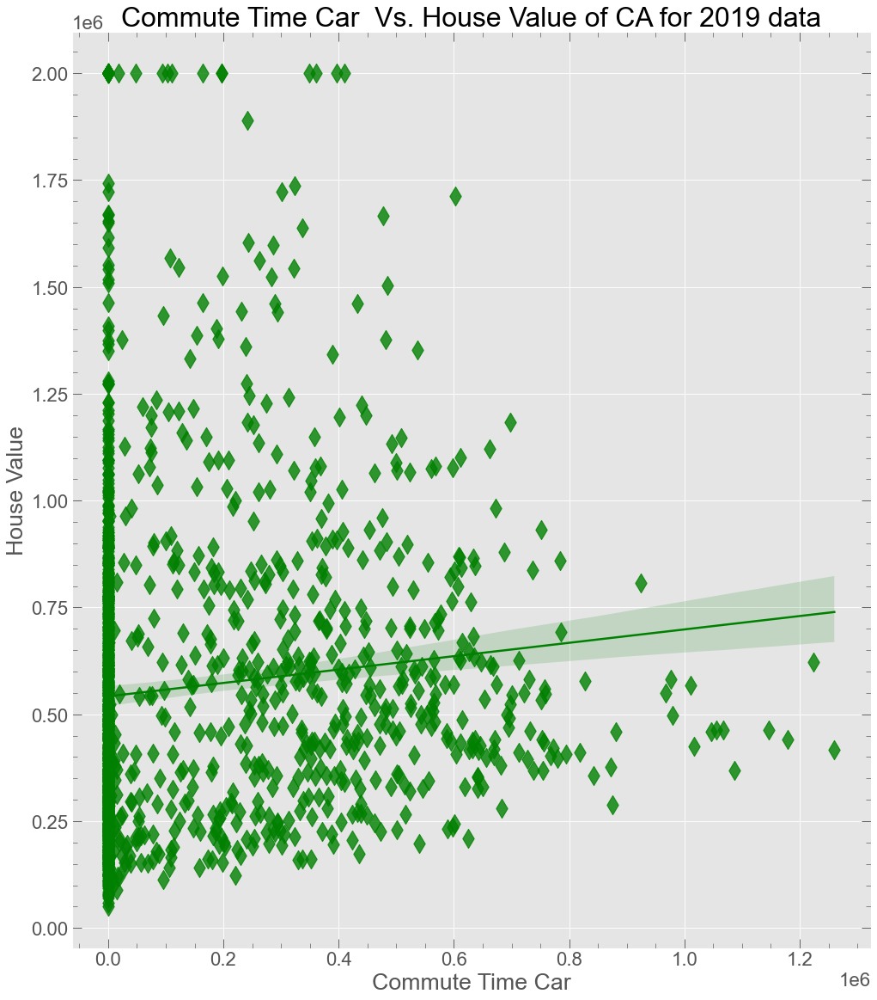

********************************************************************************


In [14]:
#scatter plots
all_datas=[ ca_2019]
years=['2019']
cols=['Public Transport Rate', 'Personal Transport Rate',
        'Commute Time Car']
c=['r', 'b','g', 'y', 'm','c','k']
for i, data in enumerate(all_datas):
    print(f'Plots for {years[i]}')
    for j in range(1, 4):
        fig = plt.figure(figsize=(15,60))
        ax = fig.add_subplot(3, 1, j)
    
        sns.regplot(x=cols[j-1], y='House Value',
           data=data,color=color[j-1],marker=marker[j-1],
            scatter_kws={'s':200},ax=ax)

        ax.set_title(f'{cols[j-1]}  Vs. House Value of CA for 2019 data')
        fig.savefig(f'figures/HouseValue_vs_{cols[j-1]}.png', 
                   bbox_inches="tight")
        plt.show()
    print('*'*80)

### Boxplots of CA County transportation data

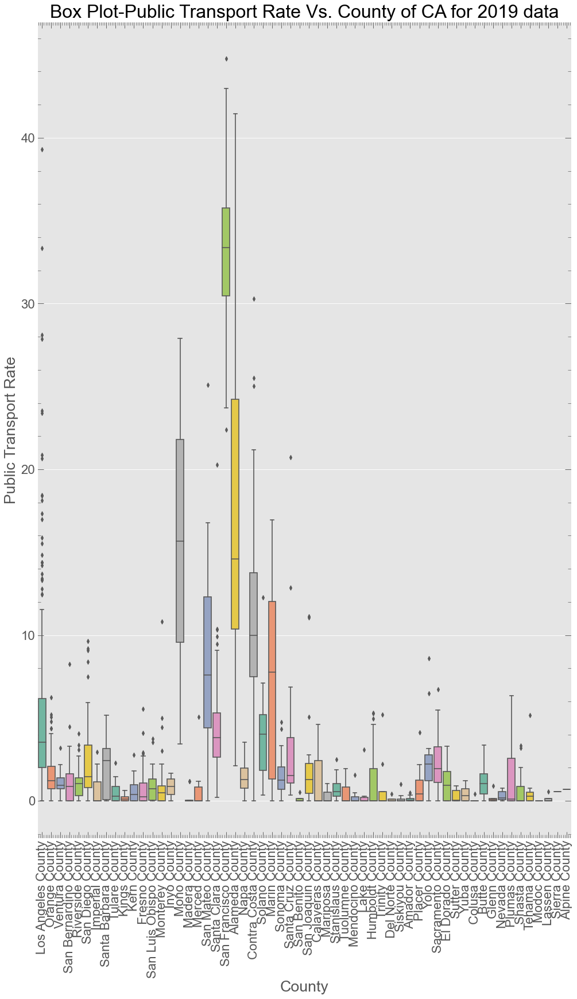

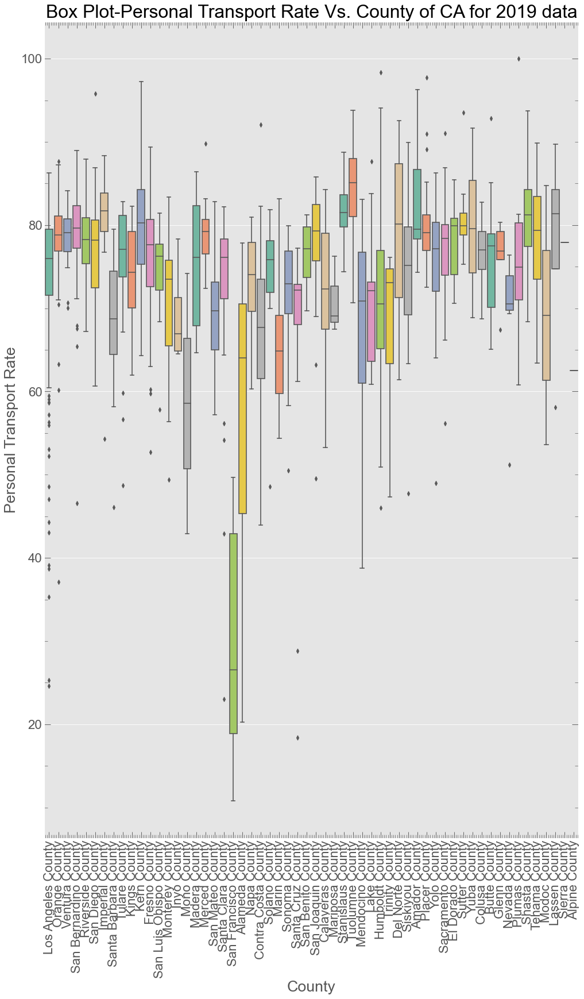

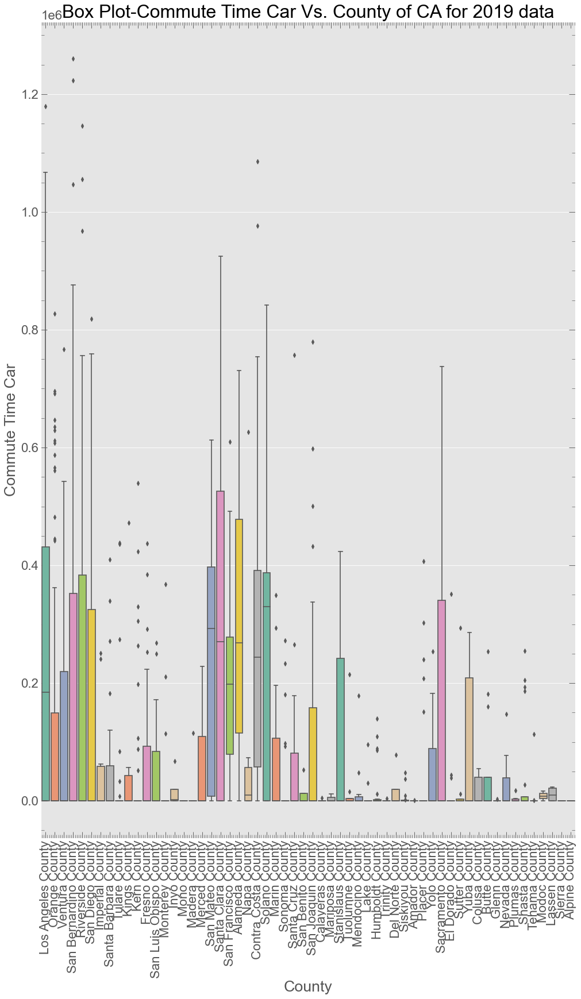

********************************************************************************


In [15]:

cols=['Public Transport Rate', 'Personal Transport Rate',
        'Commute Time Car']
  
for j in range(1, 4):
    fig = plt.figure(figsize=(15,80))
    ax = fig.add_subplot(3, 1, j)

    sns.boxplot(x='County', y=cols[j-1],
            data=ca_2019,  palette="Set2",ax=ax)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.set_ylabel(f'{cols[j-1]}')
    ax.set_xlabel('County')
    ax.set_title(f'Box Plot-{cols[j-1]} Vs. County of CA for 2019 data')
    fig.savefig(f'figures/Boxplot_{cols[j-1]}_Vs.County.png', bbox_inches="tight")
    plt.show()
print('*'*80)



## 4. Race

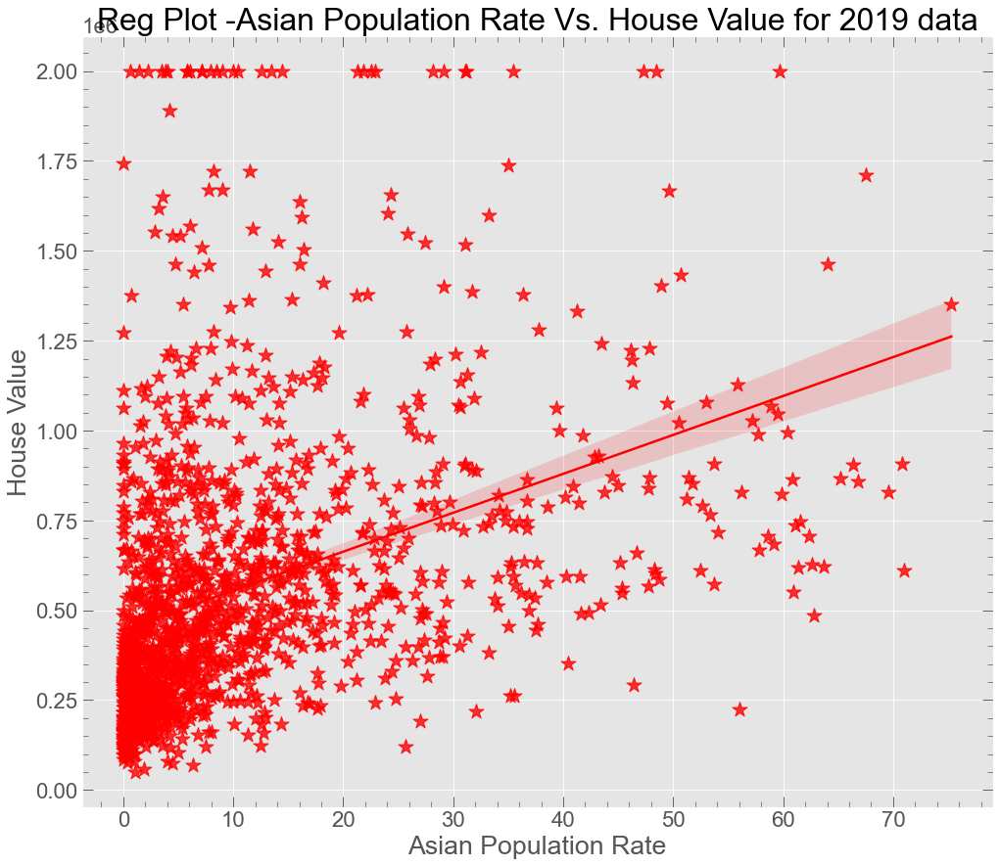

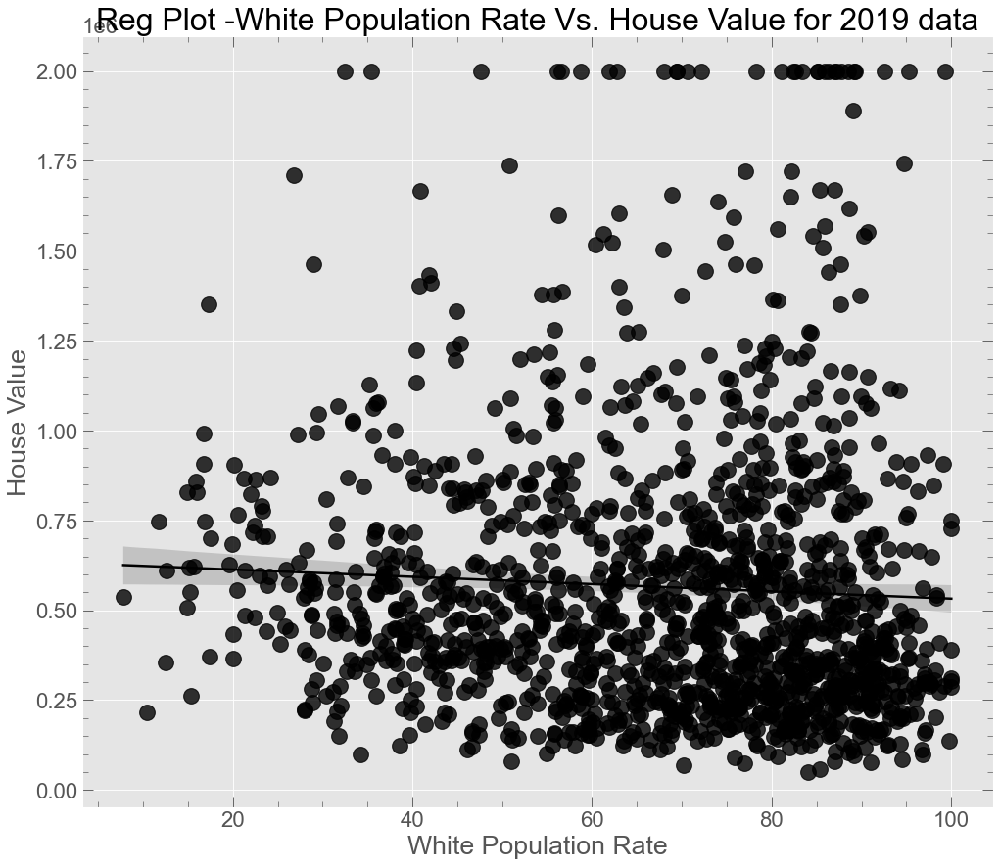

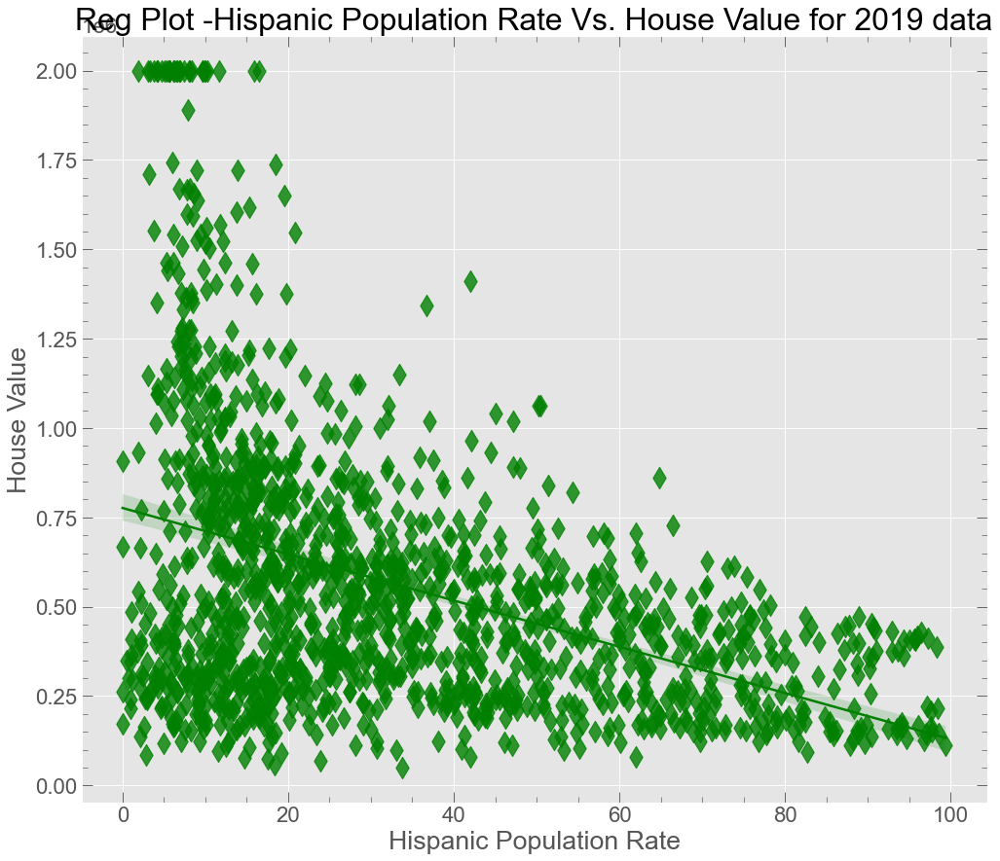

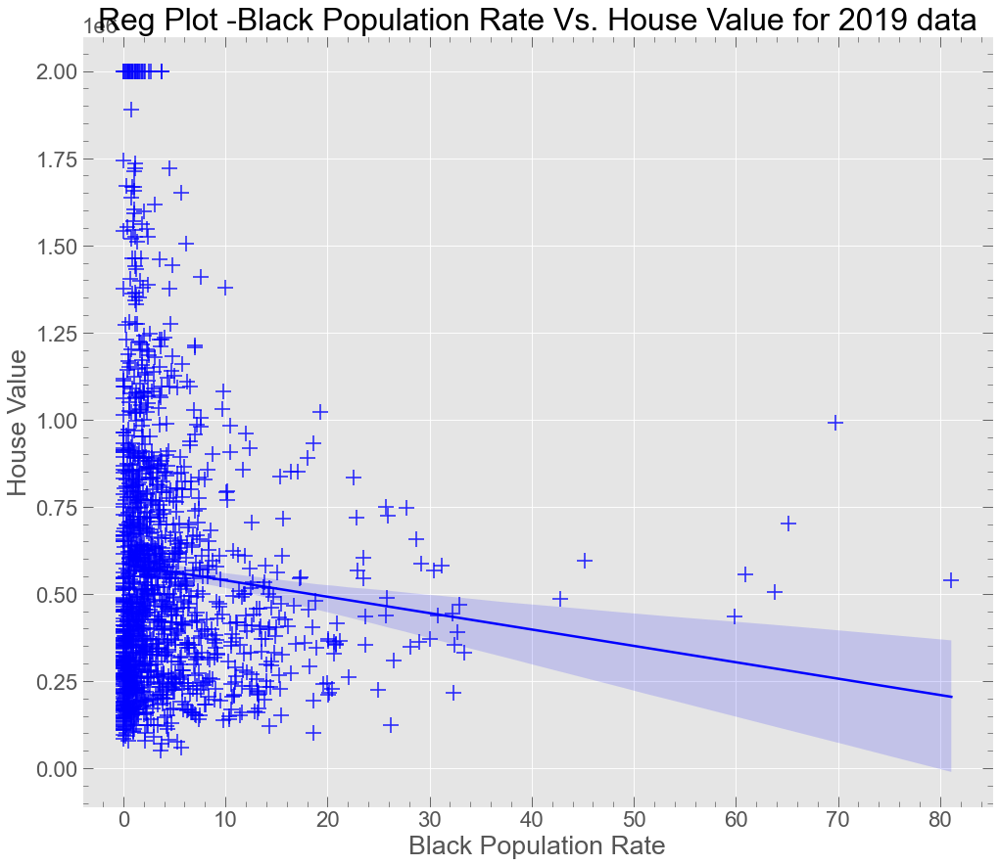

In [16]:
#scatter plots
cols=['Asian Population Rate','White Population Rate',
  'Hispanic Population Rate', 'Black Population Rate']
marker=["*","o","d","+","*","d",'+']
color=['r','k','g','b','g','y','b']

for j in range(1, 5):
    fig = plt.figure(figsize=(15,60))
    ax = fig.add_subplot(4, 1, j)
    
    sns.regplot(x=cols[j-1], y='House Value',
           data=ca_2019,color=color[j-1],marker=marker[j-1],
            scatter_kws={'s':200},ax=ax)

    ax.set_xlabel(f'{cols[j-1]}')
    ax.set_ylabel('House Value')
    ax.set_title(f'Reg Plot -{cols[j-1]} Vs. House Value for 2019 data')
    fig.savefig(f'figures/{cols[j-1]}_Vs.HouseValue.png', bbox_inches="tight")
    plt.show()



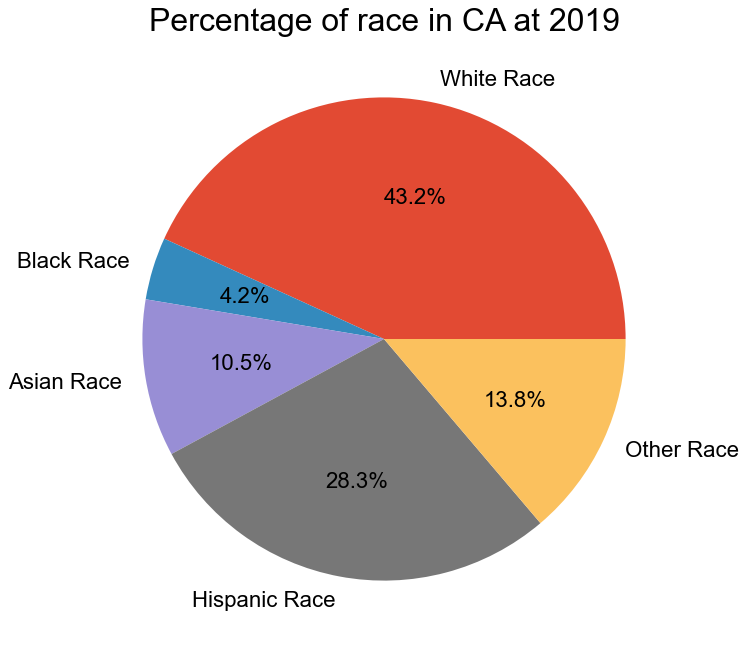

In [17]:
#Percentage of educated and uneducated population in CA
all_datas=[ca_2019]
years=['2019']
for i, data in enumerate(all_datas):
    ca_total_population=data['Population'].sum()
    ca_white=((data['Population']*data['White Population Rate'])/100).sum(axis=0)
    ca_black=((data['Population']*data['Black Population Rate'])/100).sum(axis=0)
    ca_asian=((data['Population']*data['Asian Population Rate'])/100).sum(axis=0)
    ca_hispanic=((data['Population']*data['Hispanic Population Rate'])/100).sum(axis=0)
    ca_other=(-ca_total_population+(ca_white+ca_black+ca_asian+ca_hispanic))
    #plt.figure(figsize=(5,5))
    slices=[ca_white, ca_black, ca_asian, ca_hispanic, ca_other]
    labels=["White Race","Black Race", 
            'Asian Race','Hispanic Race','Other Race']
    plt.pie(slices,labels=labels,autopct="%1.1f%%")
    plt.title(f"Percentage of race in CA at {years[i]}")
    fig.savefig(f'figures/pieplot.png', bbox_inches="tight")
    plt.show()

### Race with CA County

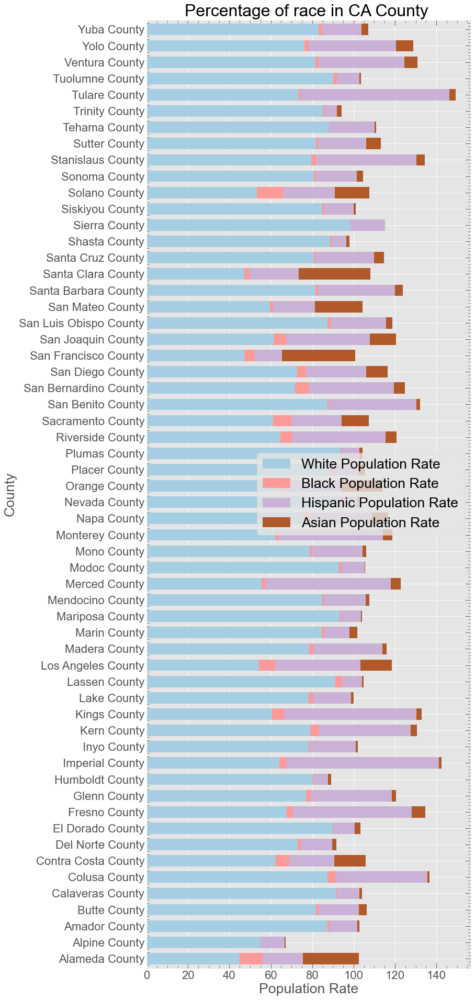

In [18]:
#to look race with county

r_2019=ca_2019[["County",'White Population Rate',
               'Black Population Rate',
               'Hispanic Population Rate',
               'Asian Population Rate']]
r_2019=r_2019.groupby('County').mean()


#plotting bar chart

fig,ax=plt.subplots(figsize=(10,30))
r_2019.plot(kind="barh",width=.7, stacked=True,colormap='Paired',ax=ax)
ax.set_xlabel("Population Rate")
ax.set_ylabel("County")
ax.legend(loc='right')
ax.set_title(f"Percentage of race in CA County ")
fig.savefig(f'figures/race_barplot.png', bbox_inches="tight")
plt.show()

# C. Corellation of different columns

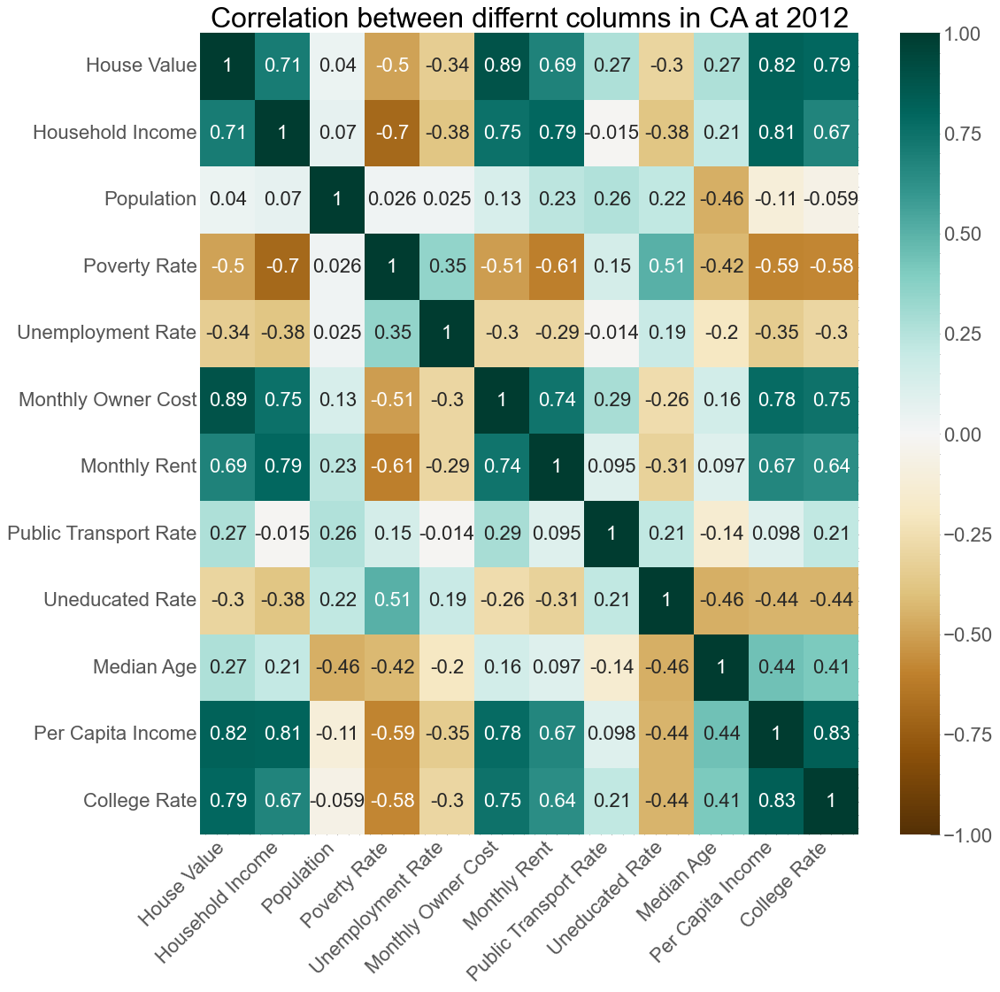

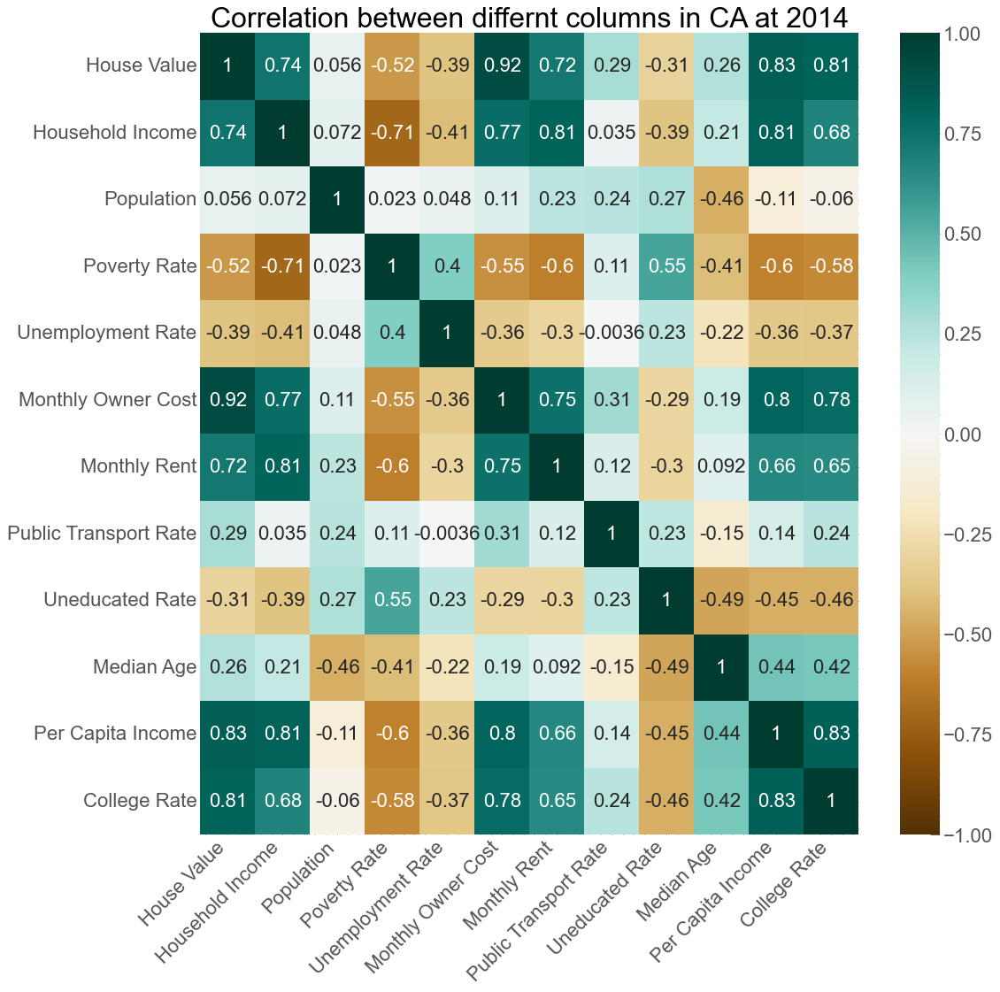

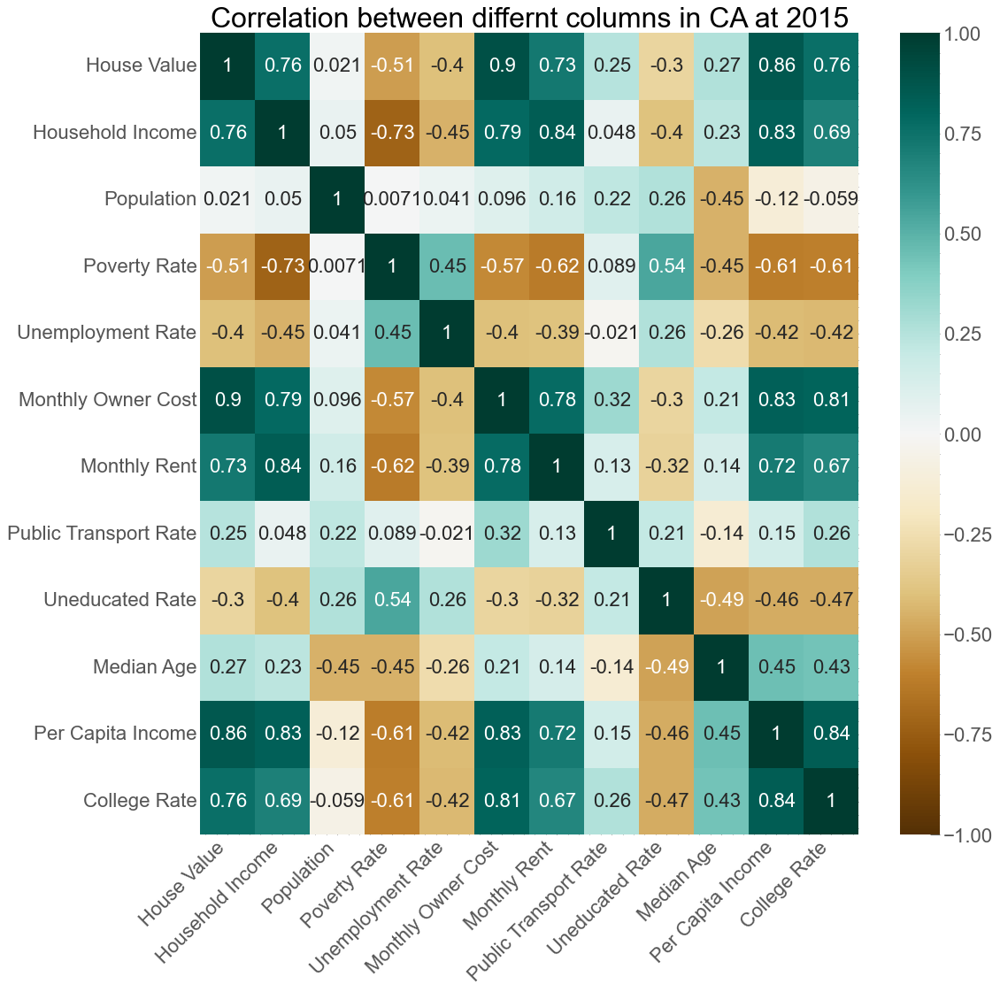

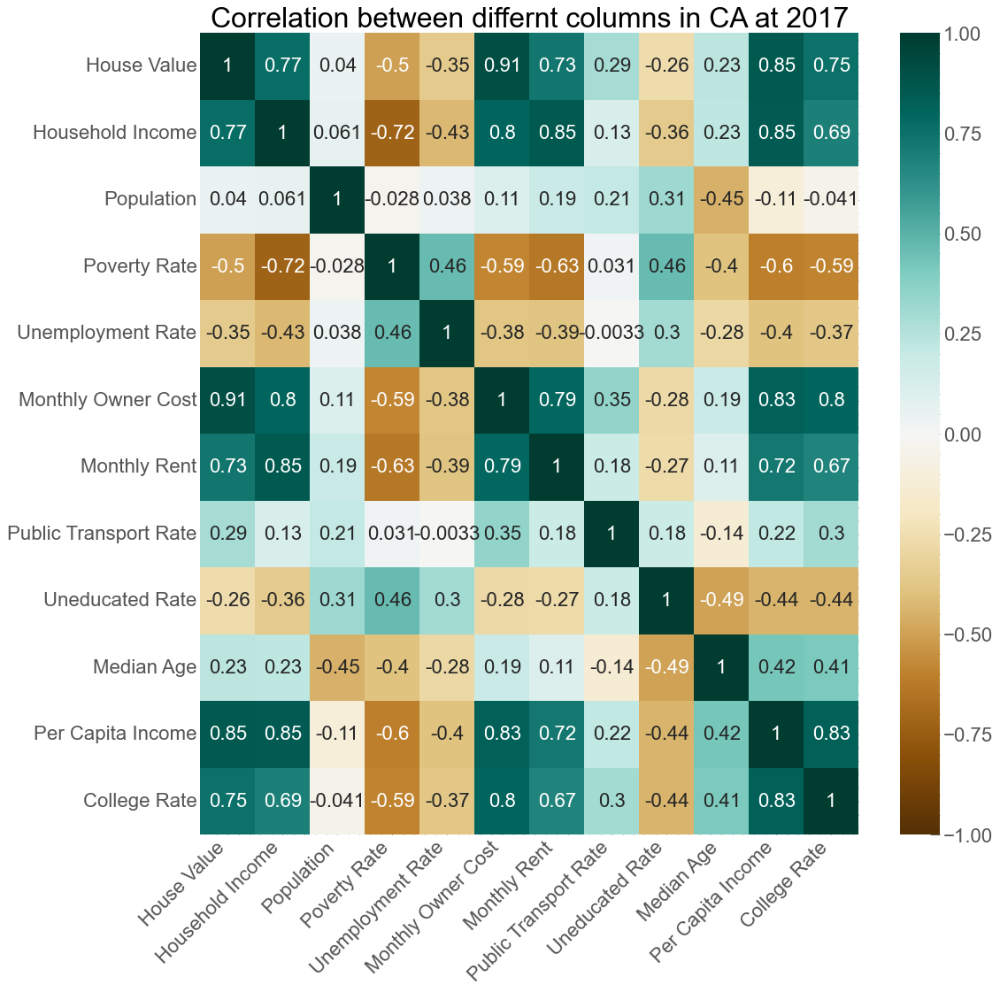

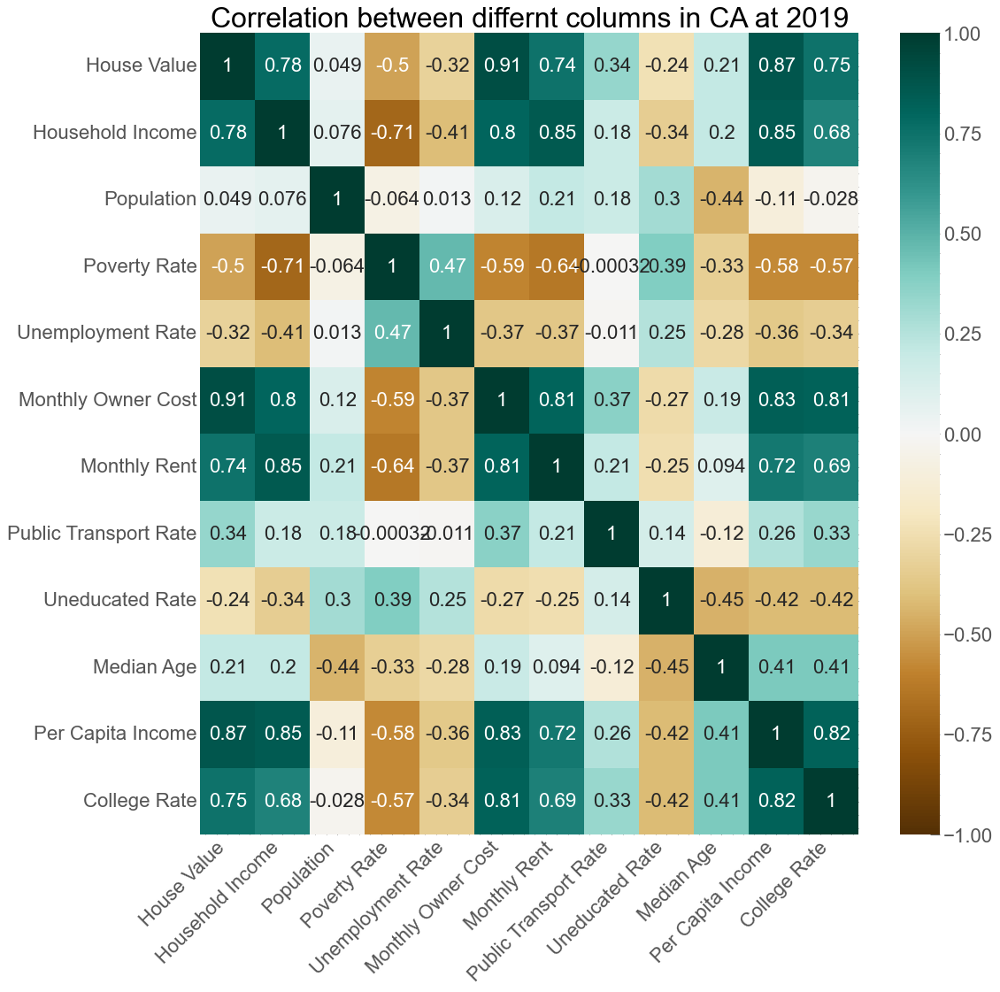

In [19]:
#selecting only important columns
all_corr=[]
all_data=[ca_2012,ca_2014, ca_2015, ca_2017, ca_2019]
year=['2012','2014','2015','2017', '2019']
for i, data in enumerate(all_data):
    ca_data=data[['City', 'House Value','Household Income','Population',
       'Poverty Rate', 'Unemployment Rate','Monthly Owner Cost', 'Monthly Rent',
       'Public Transport Rate', 'Uneducated Rate', 
        'Median Age','Per Capita Income',
       'College Rate' ]]
    #plotting all correlation using seaborn heatmap
    corr_1=ca_data.corr()
    all_corr.append(corr_1)
    fig, ax=plt.subplots(figsize=(15,15))
    sns.heatmap(corr_1,vmin=-1, vmax=1, ax=ax, cmap='BrBG',annot=True)
    ax.set_title(f"Correlation between differnt columns in CA at {year[i]}")
    ax.set_xticklabels(ax.get_xticklabels(),rotation=45,
                       horizontalalignment='right')
    #fig.savefig(f'figures/corrplot_{year[i]}.png', bbox_inches="tight")
    plt.show()

In [20]:
#dataframe of correlation of house value to other columns for different years
corr_df=pd.DataFrame({'2012 House Value':(all_corr[0]['House Value']),
                     '2014 House Value':(all_corr[1]['House Value']),
                     '2015 House Value':(all_corr[2]['House Value']),
                     '2017 House Value':(all_corr[3]['House Value']),
                     '2019 House Value':(all_corr[4]['House Value']),})
#droping house value from rows which is 100 percent corelate
corr_df_house=corr_df.drop(corr_df.index[0])

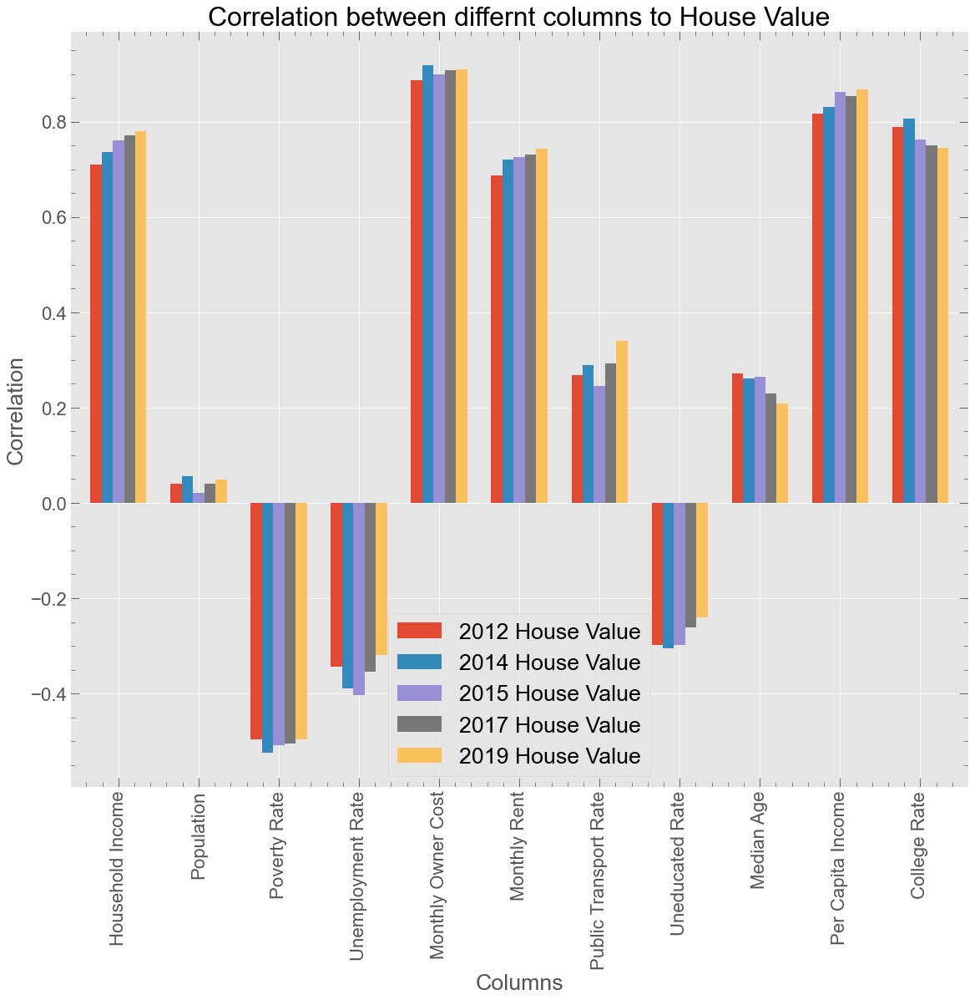

In [21]:
#Bar plot of correlation 
corr_df_house.plot(kind="bar",width=.7,figsize=(15,15))
plt.xlabel("Columns")
plt.ylabel("Correlation")
plt.tight_layout()
plt.title("Correlation between differnt columns to House Value")
plt.savefig('figures/final_corr.png', bbox_inches="tight")
plt.show()

# D. Different years house value

In [22]:
#combined data on from differnt years
df_2012=ca_2012[['Zipcode', 'County','Monthly Owner Cost', 'Monthly Rent', 'House Value']]
df_2014=ca_2014[['Zipcode', 'Monthly Owner Cost', 'Monthly Rent', 'House Value']]
df_2017=ca_2017[['Zipcode', 'Monthly Owner Cost', 'Monthly Rent', 'House Value']]
df_2019=ca_2019[['Zipcode', 'Monthly Owner Cost', 'Monthly Rent', 'House Value']]
df_combined=(df_2012.merge(df_2014, on='Zipcode', suffixes=('_2012', '_2014'))
             .merge(df_2017, on='Zipcode')
             .merge(df_2019, on='Zipcode', suffixes=('_2017', '_2019')))
df_combined=df_combined.drop(['Zipcode'], axis=1)
df_comb=df_combined.groupby('County').mean().reset_index()

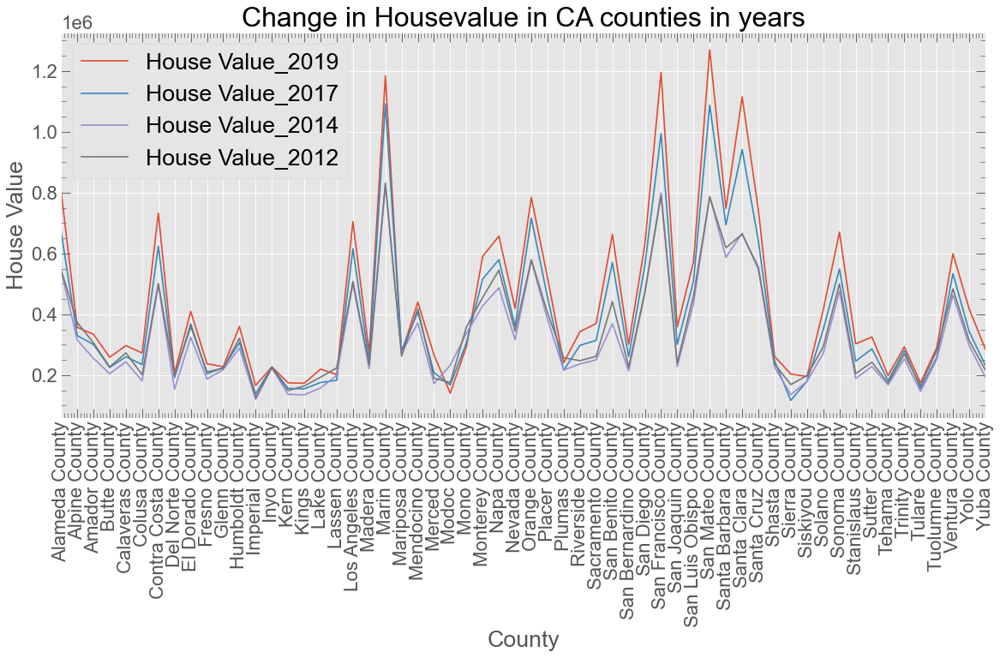

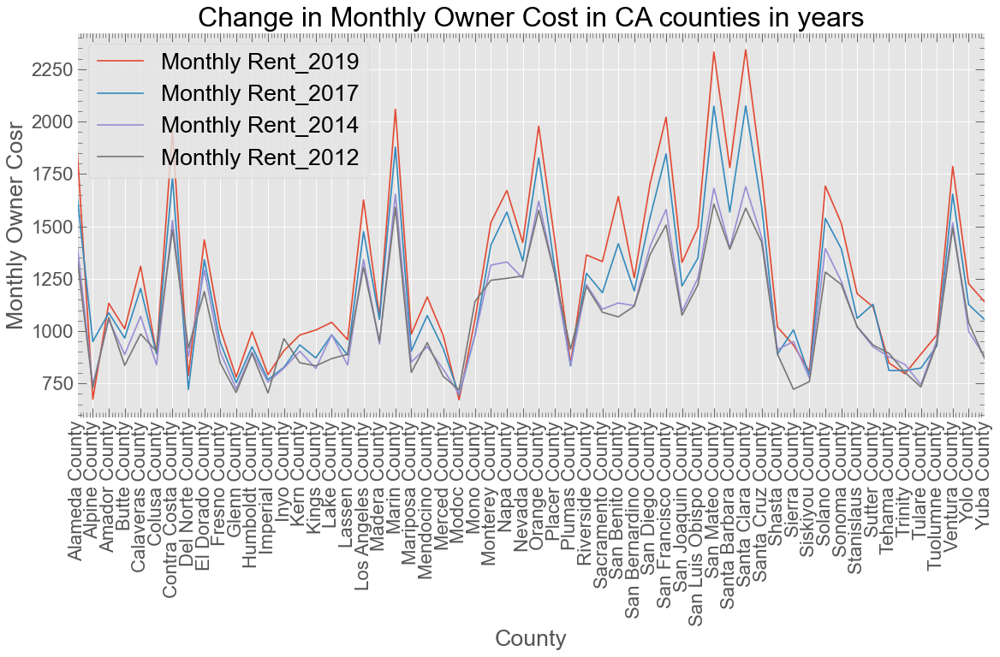

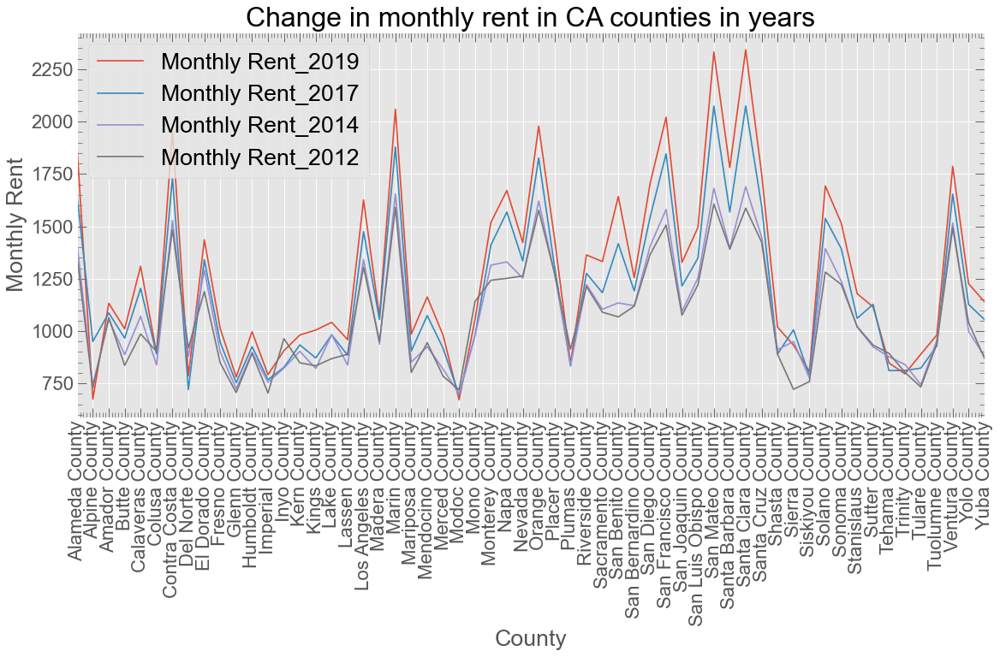

In [23]:
#plotting
counties=df_combined['County'].nunique()
x_values=np.arange(0,counties)
df_comb=df_comb.set_index('County')
county_house_value=df_comb[["House Value_2019","House Value_2017",
                            "House Value_2014","House Value_2012"]]
county_monthly_cost=df_comb[["Monthly Owner Cost_2019","Monthly Owner Cost_2017",
                                             "Monthly Owner Cost_2014",
                                             "Monthly Owner Cost_2012"]]
county_monthly_cost=df_comb[["Monthly Rent_2019","Monthly Rent_2017",
                                             "Monthly Rent_2014",
                                             "Monthly Rent_2012"]]
cols=['House Value', "Monthly Owner Cosr", 'Monthly Rent']
title=['Change in Housevalue in CA counties in years',
       'Change in Monthly Owner Cost in CA counties in years',
       'Change in monthly rent in CA counties in years']
county_all=[county_house_value,county_monthly_cost,county_monthly_cost] 

for i, county in enumerate(county_all):
    county.plot.line(xticks=x_values,rot=90,grid=True,figsize=(15,10))
    plt.xlim(0,57)
    plt.xlabel("County")
    plt.ylabel(f"{cols[i]}")
    plt.title(f'{title[i]}')
    plt.tight_layout()
    plt.savefig(f'figures/{cols[i]}_vs,County.png', bbox_inches="tight")
    plt.show()

### Distplots of house value

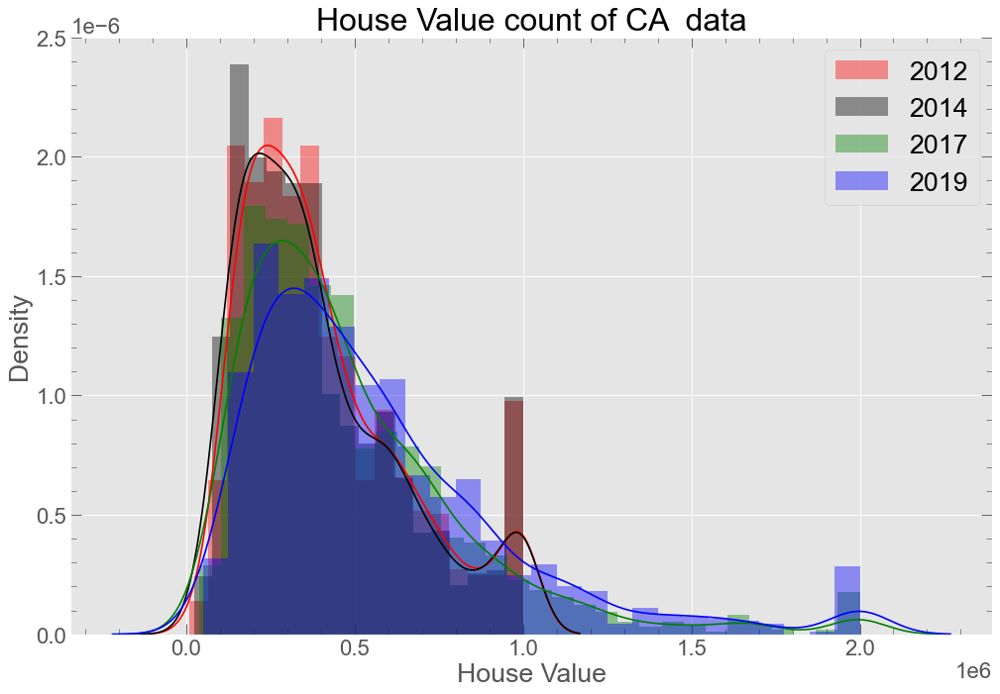

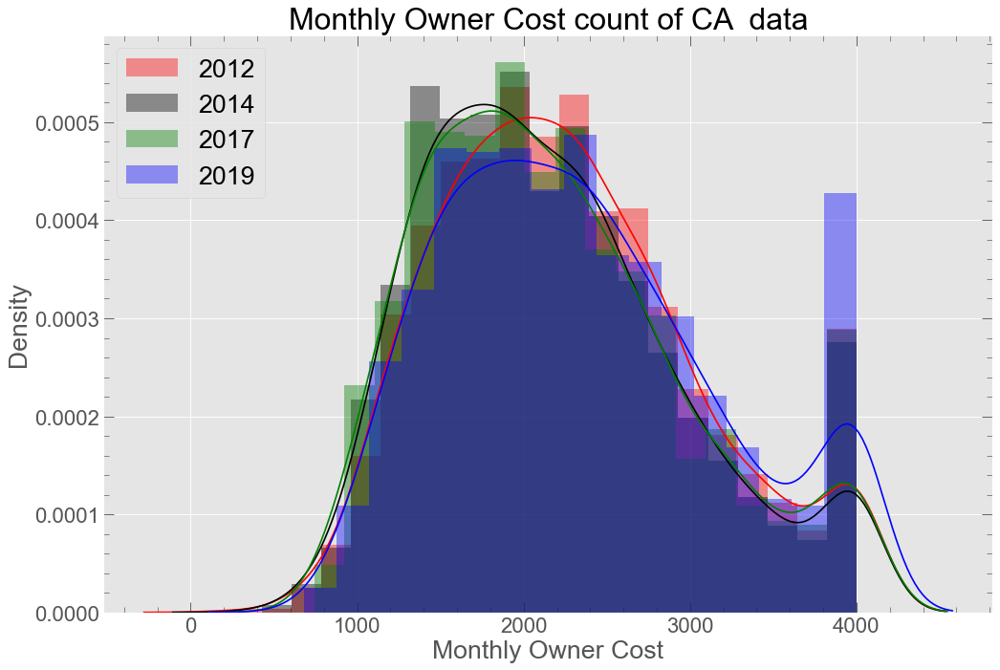

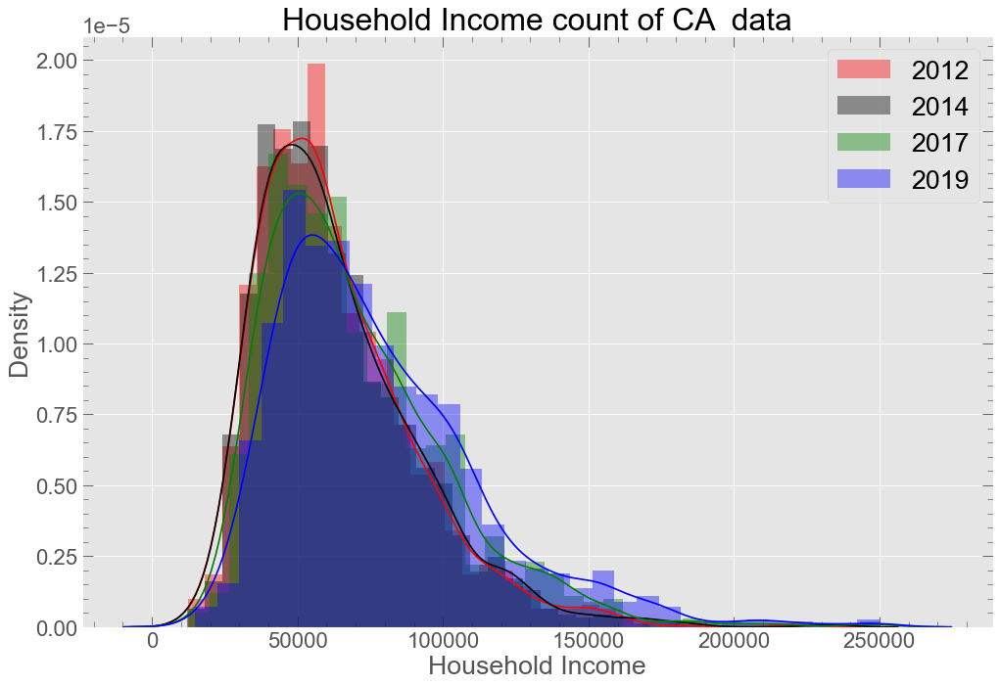

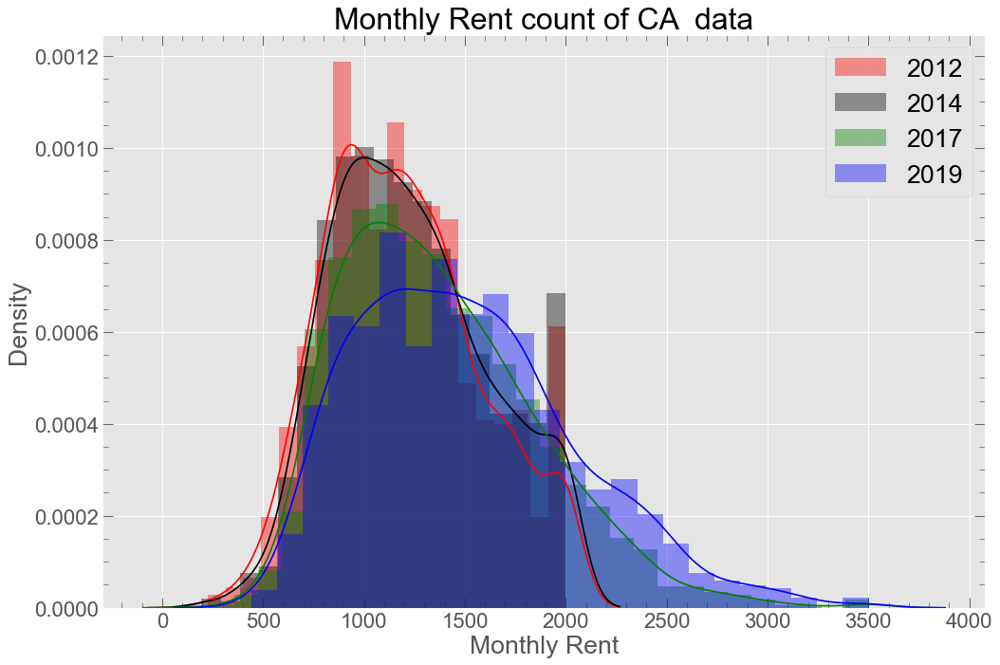

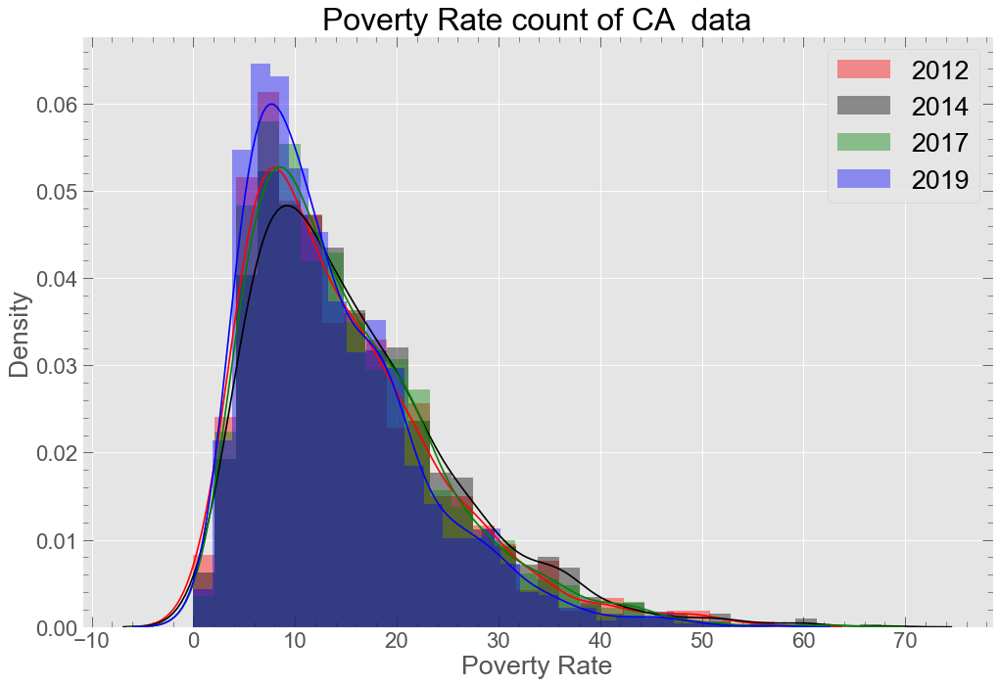

In [24]:
cols=['House Value','Monthly Owner Cost','Household Income',
  'Monthly Rent','Poverty Rate']

for i, c in enumerate(cols):
    fig,ax=plt.subplots()
    sns.distplot(ca_2012[c],color='r',kde=True, label='2012',ax=ax)
    sns.distplot(ca_2014[c],color='k', kde=True, label='2014',ax=ax)
    sns.distplot(ca_2017[c],color='g',kde=True, label='2017',ax=ax)
    sns.distplot(ca_2019[c],color='b', kde=True,  label='2019',ax=ax)
    ax.legend()
    ax.set_title(f'{c} count of CA  data')
    fig.savefig(f'figures/distplot_{cols[i]}.png', bbox_inches="tight")
    plt.show()

# E. Oneway t-test

In [25]:
p_values=[]
col=['House Value','Household Income','Population',
       'Poverty Rate', 'Unemployment Rate','Monthly Owner Cost', 'Monthly Rent',
       'Public Transport Rate', 'Uneducated Rate', 
        'Median Age','Per Capita Income',
       'College Rate']
all_data=[ca_2012,ca_2014, ca_2015, ca_2017, ca_2019]
year=['2012','2014', '2015', '2017', '2019']
for i, data in enumerate(all_data):
    for c in col:
        mean=ca_2019[c].mean()
        sample=ca_2019.sample(500)
        t=sts.ttest_1samp(sample[c],mean)
        pvalue=t[1]
        p_values.append(pvalue)

In [26]:
#creating dataframe for t test for each year
p_df=pd.DataFrame({'p_values_2012':p_values[:12],
                   'p_values_2014':p_values[12:24],
                  'p_values_2015':p_values[24:36],
                  'p_values_2017':p_values[36:48],
                  'p_values_2019':p_values[48:]}, index=col)
p_df

,p_values_2012,p_values_2014,p_values_2015,p_values_2017,p_values_2019
House Value,0.333766,0.140369,0.792789,0.458952,0.560267
Household Income,0.375025,0.735051,0.635232,0.832905,0.113010
Population,0.389520,0.778296,0.269282,0.560754,0.406870
Poverty Rate,0.925723,0.627498,0.283411,0.425977,0.966494
Unemployment Rate,0.784446,0.176037,0.974808,0.434567,0.702923
Monthly Owner Cost,0.108051,0.596912,0.658627,0.212162,0.373965
Monthly Rent,0.864544,0.457843,0.786795,0.185431,0.442193
Public Transport Rate,0.830988,0.855806,0.911321,0.791400,0.075407
Uneducated Rate,0.067298,0.844600,0.453922,0.744298,0.435214
Median Age,0.653837,0.266732,0.698384,0.324539,0.251783


# F. Top 5 Best Cities for Differnt Years

In [114]:
#getting best city for each year and appending to cities
cities=[]
all_data=[ca_2012,ca_2014, ca_2015, ca_2017, ca_2019]
for data in all_data:
    
    #selecting only important columns
    d1=data[['City', 'House Value','Household Income','Population',
       'Poverty Rate', 'Unemployment Rate','Monthly Owner Cost', 'Monthly Rent',
       'Public Transport Rate', 'Uneducated Rate', 
        'Median Age','Per Capita Income',
       'College Rate' ]]
    #using groupby method to groupby the data according to city
    d1=d1.groupby('City').agg({'House Value': 'mean',
                                  'Household Income': 'mean',
                                  'Population': 'sum',
                                   'Poverty Rate': 'mean', 
                                  'Unemployment Rate': 'mean',
                                  'Monthly Owner Cost': 'mean', 
                                  'Monthly Rent': 'mean',
                                   'Public Transport Rate': 'mean', 
                                  'Per Capita Income': 'mean',
                                   'Uneducated Rate':'mean'}).reset_index()
    d2=d1.nlargest(50,"Population")
    #getting nlargest and nsmallest of all columns and selecting their city as a list
    hv=d2.nsmallest(50, 'House Value')
    hv_c=hv['City'].tolist()    #choosing only cities 
    ue=d2.nsmallest(30, 'Unemployment Rate')
    ue_c=ue['City'].tolist()
    pt=d2.nlargest(30, 'Public Transport Rate')
    pt_c=pt['City'].tolist()
    p=d2.nsmallest(30, 'Poverty Rate')
    p_c=p['City'].tolist()
    mr=d2.nsmallest(30, 'Monthly Rent')
    mr_c=mr['City'].tolist()
    moc=d2.nsmallest(30, 'Monthly Owner Cost')
    moc_c=moc['City'].tolist()
    pci=d2.nlargest(30, 'Per Capita Income')
    pci_c=pci['City'].tolist()
    hi=d2.nlargest(30, 'Household Income')
    hi_c=hi['City'].tolist()
    uedu=d2.nsmallest(30, 'Uneducated Rate')
    uedu_c=uedu['City'].tolist()
    
    #Ading largest or smallest city from all columns

    all_city=hv_c + ue_c + pt_c + p_c +mr_c + moc_c +hi_c+pci_c+ uedu_c

    #Using counter to count most common
    my_counter=Counter(all_city)
    best_city=my_counter.most_common(5)
    cities.append(best_city)
    
print(cities)

[[('Whittier', 9), ('Elk Grove', 8), ('Oceanside', 8), ('Hayward', 8), ('Santa Rosa', 8)], [('Elk Grove', 8), ('Santa Rosa', 8), ('Hayward', 8), ('Whittier', 8), ('Anaheim', 8)], [('Salinas', 8), ('Escondido', 8), ('Whittier', 8), ('Santa Rosa', 8), ('Anaheim', 8)], [('Roseville', 8), ('Salinas', 8), ('Escondido', 8), ('Whittier', 8), ('Santa Rosa', 8)], [('Roseville', 8), ('Escondido', 8), ('Salinas', 8), ('Santa Rosa', 8), ('Anaheim', 8)]]


In [115]:
#creating a dataframe for best cities
df_best=pd.DataFrame({'city_2012':cities[0],
                     'city_2014':cities[1],
                     'city_2015':cities[2],
                     'city_2017':cities[3],
                    'city_2019':cities[4]})
df_best

,city_2012,city_2014,city_2015,city_2017,city_2019
0,"(Whittier, 9)","(Elk Grove, 8)","(Salinas, 8)","(Roseville, 8)","(Roseville, 8)"
1,"(Elk Grove, 8)","(Santa Rosa, 8)","(Escondido, 8)","(Salinas, 8)","(Escondido, 8)"
2,"(Oceanside, 8)","(Hayward, 8)","(Whittier, 8)","(Escondido, 8)","(Salinas, 8)"
3,"(Hayward, 8)","(Whittier, 8)","(Santa Rosa, 8)","(Whittier, 8)","(Santa Rosa, 8)"
4,"(Santa Rosa, 8)","(Anaheim, 8)","(Anaheim, 8)","(Santa Rosa, 8)","(Anaheim, 8)"


In [116]:
#getting dataframe for best cities in details
best_cities=[]
all_df=[]
city_value=[]
year=['2012','2014', '2015', '2017', '2019']
for i, data in enumerate(all_data):
    d3=data[(data['City']==cities[i][0][0])|
            (data['City']==cities[i][1][0])|
            (data['City']==cities[i][2][0])|
            (data['City']==cities[i][3][0])|
            (data['City']==cities[i][4][0])]
    d_city=d3[['City', 'House Value','Household Income','Population',
       'Poverty Rate', 'Unemployment Rate','Monthly Owner Cost', 'Monthly Rent',
       'Public Transport Rate', 'Uneducated Rate', 
        'Per Capita Income']]
    d_city=d_city.groupby('City').mean().reset_index()
    d_city[['House Value','Household Income','Monthly Owner Cost', 'Monthly Rent',
       'Per Capita Income']]=d_city[['House Value','Household Income','Monthly Owner Cost', 'Monthly Rent',
       'Per Capita Income']].applymap('${:.2f}'.format)
    d_city[['Poverty Rate', 'Unemployment Rate','Uneducated Rate',
       'Public Transport Rate','Population']]=d_city[['Poverty Rate', 'Unemployment Rate',
            'Uneducated Rate','Public Transport Rate', 
                        'Population']].applymap('{:.2f}'.format)
    city_value.append(d_city)
    d3=d3.drop_duplicates(subset=['City'],keep='last')
    all_df.append(d3)
    # Convert best city to list
    best_city=(cities[i][0][0], cities[i][1][0], cities[i][2][0],cities[i][3][0],cities[i][4][0])
    best_city=list(best_city)
    print(f'Best cities for {year[i]} are:{best_city}')
    best_cities.append(best_city)
    

Best cities for 2012 are:['Whittier', 'Elk Grove', 'Oceanside', 'Hayward', 'Santa Rosa']
Best cities for 2014 are:['Elk Grove', 'Santa Rosa', 'Hayward', 'Whittier', 'Anaheim']
Best cities for 2015 are:['Salinas', 'Escondido', 'Whittier', 'Santa Rosa', 'Anaheim']
Best cities for 2017 are:['Roseville', 'Salinas', 'Escondido', 'Whittier', 'Santa Rosa']
Best cities for 2019 are:['Roseville', 'Escondido', 'Salinas', 'Santa Rosa', 'Anaheim']


In [117]:
#creating a dataframe for best cities
df_best=pd.DataFrame({'city_2012':best_cities[0],
                     'city_2014':best_cities[1],
                     'city_2015':best_cities[2],
                     'city_2017':best_cities[3],
                    'city_2019':best_cities[4]})
df_best

,city_2012,city_2014,city_2015,city_2017,city_2019
0,Whittier,Elk Grove,Salinas,Roseville,Roseville
1,Elk Grove,Santa Rosa,Escondido,Salinas,Escondido
2,Oceanside,Hayward,Whittier,Escondido,Salinas
3,Hayward,Whittier,Santa Rosa,Whittier,Santa Rosa
4,Santa Rosa,Anaheim,Anaheim,Santa Rosa,Anaheim


In [118]:
#value of best cities
print('Best cities for 2012')
best_cities_values_2012=city_value[0]
best_cities_values_2012



Best cities for 2012


,City,House Value,Household Income,Population,Poverty Rate,Unemployment Rate,Monthly Owner Cost,Monthly Rent,Public Transport Rate,Uneducated Rate,Per Capita Income
0,Elk Grove,$279466.67,$80070.67,54022.00,9.33,4.89,$2262.00,$1480.33,2.74,1.37,$28459.33
1,Hayward,$389475.00,$67248.00,44516.25,13.31,7.27,$2439.25,$1313.25,7.27,1.60,$28423.75
2,Oceanside,$356150.00,$59746.75,48447.25,11.71,4.77,$2276.00,$1480.50,2.80,0.94,$25499.25
3,Santa Rosa,$393500.00,$61567.50,34718.83,12.61,5.62,$2302.17,$1236.50,1.63,1.28,$31017.00
4,Whittier,$400783.33,$67164.67,32110.83,10.53,4.77,$2283.00,$1251.33,2.83,1.32,$25393.17


In [119]:
#value of best cities
print('Best cities for 2014')
best_cities_values_2014=city_value[1]

best_cities_values_2014

Best cities for 2014


,City,House Value,Household Income,Population,Poverty Rate,Unemployment Rate,Monthly Owner Cost,Monthly Rent,Public Transport Rate,Uneducated Rate,Per Capita Income
0,Anaheim,$437128.57,$67765.14,51501.43,14.75,5.33,$2313.57,$1501.14,4.00,1.53,$27730.57
1,Elk Grove,$274266.67,$79339.33,56622.67,10.30,5.22,$2059.67,$1505.00,2.39,1.68,$28767.33
2,Hayward,$387225.00,$67411.00,45670.00,14.28,6.62,$2343.75,$1355.00,7.82,1.72,$28419.25
3,Santa Rosa,$386316.67,$62346.00,35288.67,12.40,5.35,$2114.50,$1305.17,1.84,1.37,$31530.67
4,Whittier,$389600.00,$66982.17,32652.67,12.18,4.51,$2164.67,$1292.67,2.88,1.48,$25072.00


In [120]:
#value of best cities
print('Best cities for 2015')
best_cities_values_2015=city_value[2]
best_cities_values_2015

Best cities for 2015


,City,House Value,Household Income,Population,Poverty Rate,Unemployment Rate,Monthly Owner Cost,Monthly Rent,Public Transport Rate,Uneducated Rate,Per Capita Income
0,Anaheim,$448871.43,$69156.57,51815.57,14.33,4.48,$2261.71,$1531.14,3.61,1.57,$28000.57
1,Escondido,$401500.00,$58950.75,44465.75,16.09,3.75,$2298.00,$1239.50,1.66,1.42,$26995.50
2,Salinas,$368560.00,$66219.80,37178.80,15.11,3.69,$2129.60,$1277.80,0.38,1.73,$27775.80
3,Santa Rosa,$406250.00,$62501.50,35692.00,11.81,4.35,$2039.00,$1330.17,1.77,1.45,$32142.33
4,Whittier,$404200.00,$67329.50,32860.33,11.69,3.89,$2135.67,$1308.83,2.67,1.64,$25439.50


In [121]:
#value of best cities
print('Best cities for 2017')
best_cities_values_2017=city_value[3]
best_cities_values_2017

Best cities for 2017


,City,House Value,Household Income,Population,Poverty Rate,Unemployment Rate,Monthly Owner Cost,Monthly Rent,Public Transport Rate,Uneducated Rate,Per Capita Income
0,Escondido,$455600.00,$67247.50,44647.00,13.66,2.92,$2332.50,$1401.00,1.85,1.44,$30070.75
1,Roseville,$384433.33,$81281.67,45833.67,9.13,2.88,$2097.00,$1451.33,1.33,0.44,$37908.33
2,Salinas,$438320.00,$73108.40,37600.00,13.16,2.73,$2181.00,$1470.60,0.56,1.66,$30730.00
3,Santa Rosa,$472766.67,$68532.00,36124.83,11.04,3.24,$2173.50,$1465.50,1.70,1.68,$35187.50
4,Whittier,$461333.33,$69004.00,32831.67,11.37,2.87,$2184.00,$1399.67,2.00,1.79,$26444.83


In [122]:
#value of best cities
print('Best cities for 2019')
best_cities_values_2019=city_value[4]
best_cities_values_2019

Best cities for 2019


,City,House Value,Household Income,Population,Poverty Rate,Unemployment Rate,Monthly Owner Cost,Monthly Rent,Public Transport Rate,Uneducated Rate,Per Capita Income
0,Anaheim,$573928.57,$80847.00,52659.29,13.01,2.67,$2462.00,$1779.71,2.78,1.93,$32282.14
1,Escondido,$515350.00,$73850.75,44869.00,11.18,2.15,$2484.50,$1551.00,1.84,1.66,$33631.00
2,Roseville,$435566.67,$88502.33,46766.33,8.75,2.30,$2252.67,$1609.33,1.32,0.65,$41669.33
3,Salinas,$520420.00,$79131.60,37754.00,12.61,2.26,$2321.20,$1661.40,0.69,1.72,$32177.00
4,Santa Rosa,$557116.67,$77016.50,35787.67,9.92,2.50,$2369.83,$1628.83,1.53,1.67,$39365.83


# G. Plotting using gmaps

## Best cities of 2012

In [123]:

#Using the template add the best city marks to the heatmap
info_box_template = """
<dl>
<dt>City:</dt><dd>{City}</dd>
<dt>House Value:</dt><dd>{House Value}</dd>
<dt>Household Income:</dt><dd>{Household Income}</dd>
<dt>Population:</dt><dd>{Population}</dd>
<dt>Unemployment Rate:</dt><dd>{Unemployment Rate}</dd>
<dt>Poverty Rate:</dt><dd>{Poverty Rate}</dd>
<dt>Monthly Owner Cost:</dt><dd>{Monthly Owner Cost}</dd>
<dt>Monthly Rent:</dt><dd>{Monthly Rent}</dd>
<dt>Uneducated Rate:</dt><dd>{Uneducated Rate}</dd>
<dt>Public Transport Rate:</dt><dd>{Public Transport Rate}</dd>
<dt>Per Capita Income:</dt><dd>{Per Capita Income}</dd>
</dl>

"""


In [124]:
#2012
d_2012=all_df[0]
marker_locations = d_2012[['Lat', 'Lng']]
best_cities_values_2012=city_value[0]

# Create a marker_layer using the best city list to fill the info box
layout={
        'width': '1000px',
        'height': '800px',
        'padding': '3px',
        'border': '1px solid black'
}
fig = gmaps.figure(layout=layout, map_type="HYBRID")
markers = gmaps.marker_layer(marker_locations,
            info_box_content=[info_box_template.format(**row) for index, row in best_cities_values_2012.iterrows()])
fig.add_layer(markers)
    
fig

Figure(layout=FigureLayout(border='1px solid black', height='800px', padding='3px', width='1000px'))

## Best cities of 2014

In [125]:
#2014
d_2014=all_df[1]
marker_locations = d_2014[['Lat', 'Lng']]
best_cities_values_2014=city_value[1]
# Create a marker_layer using the best city list to fill the info box
layout={
        'width': '1000px',
        'height': '800px',
        'padding': '3px',
        'border': '1px solid black'
}
fig = gmaps.figure(layout=layout, map_type="HYBRID")
markers = gmaps.marker_layer(marker_locations,
            info_box_content=[info_box_template.format(**row) for index, row in best_cities_values_2014.iterrows()])
fig.add_layer(markers)
    
fig

Figure(layout=FigureLayout(border='1px solid black', height='800px', padding='3px', width='1000px'))

## Best cities of 2015

In [126]:
#2012
d_2015=all_df[2]
marker_locations = d_2015[['Lat', 'Lng']]
best_cities_values_2015=city_value[2]
# Create a marker_layer using the best city list to fill the info box
layout={
        'width': '1000px',
        'height': '800px',
        'padding': '3px',
        'border': '1px solid black'
}
fig = gmaps.figure(layout=layout, map_type="HYBRID")
markers = gmaps.marker_layer(marker_locations,
            info_box_content=[info_box_template.format(**row) for index, row in best_cities_values_2015.iterrows()])
fig.add_layer(markers)
    
fig

Figure(layout=FigureLayout(border='1px solid black', height='800px', padding='3px', width='1000px'))

## Best cities of 2017

In [127]:
#2017
d_2017=all_df[3]
marker_locations = d_2017[['Lat', 'Lng']]
best_cities_values_2017=city_value[3]
# Create a marker_layer using the best city list to fill the info box
layout={
        'width': '1000px',
        'height': '800px',
        'padding': '3px',
        'border': '1px solid black'
}
fig = gmaps.figure(layout=layout, map_type="HYBRID")
markers = gmaps.marker_layer(marker_locations,
            info_box_content=[info_box_template.format(**row) for index, row in best_cities_values_2017.iterrows()])
fig.add_layer(markers)
    
fig

Figure(layout=FigureLayout(border='1px solid black', height='800px', padding='3px', width='1000px'))

## Best cities of 2019

In [128]:
#2019
d_2019=all_df[4]
marker_locations = d_2019[['Lat', 'Lng']]
best_cities_values_2019=city_value[4]

# Create a marker_layer using the best city list to fill the info box
layout={
        'width': '1000px',
        'height': '800px',
        'padding': '3px',
        'border': '1px solid black'
}
fig = gmaps.figure(layout=layout, map_type="HYBRID")
markers = gmaps.marker_layer(marker_locations,
            info_box_content=[info_box_template.format(**row) for index, row in best_cities_values_2019.iterrows()])
fig.add_layer(markers)
    
fig

Figure(layout=FigureLayout(border='1px solid black', height='800px', padding='3px', width='1000px'))